In [ ]:
import random
import numpy as np
import pandas as pd


Questions

1. [65pts] Dans cette question, nous allons créer un petit réacteur évolutif artificiel. Cet exercice va être divisé en plusieurs sous-questions.
 
 Le but va être d’observer comme **un ensemble de séquences d’ADN évolue lorsque leur probabilité de se développer dépend de sa capacité à encoder une protéine**.

Quelques constantes:
  i L’alphabet sera toujours composé de A, C, G et T.

  ii La longueur d’une séquence est toujours 50

  iii Une génération a toujours 100 individus.

(a) [5pts] Faites une fonction 

jc69(<séquence>, \<taux_mutation>)

qui va retourner la séquence mutée selon le modèle de Jukes Cantor.
Avec une probabilité de mutation u la matrice de transition 

In [ ]:
u = 0.5
sequence = "ACGT"
sequence_mutee = ""
DNAList = ["A","C","G","T"]
df = pd.DataFrame({"A":[1-u,u/3,u/3,u/3],
                   "C":[u/3,1-u,u/3,u/3],
                   "G":[u/3,u/3,1-u,u/3],
                   "T":[u/3,u/3,u/3,1-u]},index = DNAList)
for base in sequence:
  base_change = np.random.choice(DNAList, 1, p=[df[base]["A"],df[base]["C"],df[base]["G"],df[base]["T"]])[0]
  sequence_mutee += base_change
sequence_mutee

'CCAT'

In [ ]:
def jc69(sequence, taux_mutation):
  u = taux_mutation
  sequence_mutee = ""
  DNAList = ["A","C","G","T"]
  # la probabilité de mutation u la matrice de transition 
  df = pd.DataFrame({"A":[1-u,u/3,u/3,u/3],
                    "C":[u/3,1-u,u/3,u/3],
                    "G":[u/3,u/3,1-u,u/3],
                    "T":[u/3,u/3,u/3,1-u]},index = DNAList)
  for base in sequence:
    # Choisir des éléments avec des probabilités différentes
    base_change = np.random.choice(DNAList, 1, p=[df[base]["A"],df[base]["C"],df[base]["G"],df[base]["T"]])[0]
    sequence_mutee += base_change

  return sequence_mutee
  

In [ ]:
jc69("ACGT",0)

'ACGT'

(b) [5pts]Faites une fonction

k2p(<séquence>, \<taux_transition>, \<taux_transversion>)

qui va retourner la séquence mutée selon le modèle de Kimura deux
paramètres.Avec un taux de transition α et de transversion β la matrice de transition

In [ ]:
a = 0
b = 0.5
sequence = "ACGT"
sequence_mutee = ""
DNAList = ["A","C","G","T"]
# la probabilité de mutation u la matrice de transition
df = pd.DataFrame({"A":[1-(a+2*b),b,a,b],
                   "C":[b,1-(a+2*b),b,a],
                   "G":[a,b,1-(a+2*b),b],
                   "T":[b,a,b,1-(a+2*b)]},index = DNAList)
for base in sequence:
  # Choisir des éléments avec des probabilités différentes
  base_change = np.random.choice(DNAList, 1, p=[df[base]["A"],df[base]["C"],df[base]["G"],df[base]["T"]])[0]
  sequence_mutee += base_change
sequence_mutee

'TGCA'

In [ ]:
def k2p(sequence,taux_transition,taux_transversion):
  a = taux_transition
  b = taux_transversion
  sequence_mutee = ""
  DNAList = ["A","C","G","T"]
  # la probabilité de mutation u la matrice de transition
  df = pd.DataFrame({"A":[1-(a+2*b),b,a,b],
                    "C":[b,1-(a+2*b),b,a],
                    "G":[a,b,1-(a+2*b),b],
                    "T":[b,a,b,1-(a+2*b)]},index = DNAList)
  for base in sequence:
    # Choisir des éléments avec des probabilités différentes
    base_change = np.random.choice(DNAList, 1, p=[df[base]["A"],df[base]["C"],df[base]["G"],df[base]["T"]])[0]
    sequence_mutee += base_change

  return sequence_mutee

In [ ]:
k2p('ACGT',0,0)

'ACGT'

(c) [5pts] Faites une fonction

selection(<liste_séquences>, \<liste_scores>
ou <liste_séquences> et <liste_scores> sont deux listes de mêmes
longueur. Le score à la position i correspond à la séquence à la
position 

Par exemple, si nous avons les séquences [’ACGT’, ’CCGT’,’ CGAT’]
avec les scores [1, 5, 4] alors la fonction devrait retourner ACGT
10% du temps, CCGT 50% du temps et CGAT 40% du temps.

In [ ]:
list_sequences = ['ACGT', 'CCGT','CGAT']
list_scores = [1, 5, 4]
p_choisir = {}
zipped = list(zip(list_sequences, list_scores))
for item in zipped:
  seq = item[0]
  score = float(item[1])
  p_choisir[seq] = score/sum(list_scores)
p_choisir

{'ACGT': 0.1, 'CCGT': 0.5, 'CGAT': 0.4}

In [ ]:
print(list(p_choisir.keys()))
print(list(p_choisir.values()))

['ACGT', 'CCGT', 'CGAT']
[0.1, 0.5, 0.4]


In [ ]:
for sequence in list_sequences:
    # Choisir des éléments avec des probabilités différentes
    seq_choice = np.random.choice(list(p_choisir.keys()), 1, p= list(p_choisir.values()))[0]
seq_choice

'CCGT'

In [ ]:
def selection(list_sequences,list_scores):
  p_choisir = {}
  # mettre le score à la position i correspond à la séquence à la position i en employant .
  zipped = list(zip(list_sequences, list_scores))
  # calculer le score pour chaque sequence dans la liste de sequences.
  for item in zipped:
    seq = item[0]
    score = float(item[1])
    p_choisir[seq] = score/sum(list_scores)  # Stocker dans le dictionnaire pour une recherche facile

  for sequence in list_sequences:
    # Choisir des éléments avec des probabilités différentes
    seq_choice = np.random.choice(list(p_choisir.keys()), 1, p= list(p_choisir.values()))[0]

  return seq_choice

In [ ]:
selection(['ACGT', 'CCGT','CGAT'], [1,5, 4])

'CGAT'

(d) [10pts] Faites une fonction

fitness(<séquence>, <protéine_cible>)

qui va (1) calculer les 3 protéines possibles encodées dans la séquence
Indice: Biopython https://biopython.org/wiki/Seq 

(2) aligner chacune avec la protéine cible, avec pénalité de -2 pour commencer un nouveau gap et de -1 pour le prolonger, en utilisant la matrice de score BLOSUM Indice: Biopython https://biopython.org/docs/1.75/api/Bio.pairwise2.html 

(3) retourne le meilleur score d’alignement + 20.

In [ ]:
!pip install biopython

     |████████████████████████████████| 2.3MB 8.0MB/s 


In [ ]:
from Bio.Seq import Seq

In [ ]:
sequence = 'GACTAGTCGATTCATGCTAC'
#calculer les 3 protéines possibles encodées dans la séquence Indice

coding_dna = Seq(sequence)
print(coding_dna.translate())
str(coding_dna.translate()).replace('*','')

D*SIHA


/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


'DSIHA'

In [ ]:
sequence = 'ACGACGACGAT'
#calculer les 3 protéines possibles encodées dans la séquence Indice
# changer les index. Le coding_dna va commencer à la première, deuxième et troisième position
proteins_possible = []
for i in range(3):
  coding_dna = Seq(sequence[i:])
  protein = str(coding_dna.translate()).replace('*','')
  proteins_possible.append(protein)

proteins_possible

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


['TTT', 'RRR', 'DDD']

In [ ]:
from Bio.SubsMat import MatrixInfo as matlist
from Bio import pairwise2
from Bio.pairwise2 import format_alignment

matrix = matlist.blosum62  # en utilisant la matrice de score BLOSUM I
# valeur initiale : Définisser un score suffisamment grand et impossible 
score = 9999999999999
#for a in pairwise2.align.globalds("DDD", "QN", matrix,-2,-1):
    #print(format_alignment(*a))

# aligner chacune avec la protéine cible, 
#avec pénalité de -2 pour commencer un nouveau gap et de -1 pour le prolonger
alignments = pairwise2.align.globalds("DDD", "QN", matrix,-2,-1)
for align in list(alignments):
  if score == 9999999999999:
    score = align[2]         #le premier score 
  else:
    if align[2] > score:
      score = align[2]    
      # Comparez avec le score précédent, afficher toujours le score le plus élevé
print(score)

-1.0


In [ ]:
prot_cible = "QN"
matrix = matlist.blosum62  # en utilisant la matrice de score BLOSUM I
# valeur initiale : Définisser un score suffisamment grand et impossible 

score = 9999999999999

for aa in proteins_possible:
# aligner chacune avec la protéine cible, 
#avec pénalité de -2 pour commencer un nouveau gap et de -1 pour le prolonger
  alignments = pairwise2.align.globalds(aa, prot_cible, matrix,-2,-1)
  for align in list(alignments):
    if score == 9999999999999:
      score = align[2]         #le premier score 
    else:
      if align[2] > score:
        score = align[2]    
        # Comparez avec le score précédent, afficher toujours le score le plus élevé
  print(score + 10)

7.0
9.0
9.0


In [ ]:
from Bio.SubsMat import MatrixInfo as matlist
from Bio import pairwise2

def fitness(sequence, prot_cible):
  #(1) calculer les 3 protéines possibles encodées dans la séquence Indice
  # changer les index. Le coding_dna va commencer à la première, deuxième et troisième position
  proteins_possible = []
  for i in range(3):
    coding_dna = Seq(sequence[i:])
    protein = str(coding_dna.translate()).replace('*','')
    proteins_possible.append(protein)
  #print(proteins_possible)

  #(2) aligner chacune avec la protéine cible

  matrix = matlist.blosum62  # en utilisant la matrice de score BLOSUM I

  # valeur initiale : Définisser un score suffisamment grand et impossible 
  score = 9999999999999

  for aa in proteins_possible:
  # aligner chacune avec la protéine cible, 
  #avec pénalité de -2 pour commencer un nouveau gap et de -1 pour le prolonger
    alignments = pairwise2.align.globalds(aa, prot_cible, matrix,-2,-1)
    for align in list(alignments):
      if score == 9999999999999:
        score = align[2]         #le premier score 
      else:
        if align[2] > score:
          score = align[2]    
          # Comparez avec le score précédent, afficher toujours le score le plus élevé

  return int(score) + 20   #retourne le meilleur score d’alignement + 20.


/usr/local/lib/python3.7/dist-packages/Bio/SubsMat/__init__.py:131: BiopythonDeprecationWarning: Bio.SubsMat has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.substitution_matrices as a replacement, and contact the Biopython developers if you still need the Bio.SubsMat module.
  BiopythonDeprecationWarning,


In [ ]:
fitness('GACTAGTCGATTCATGCTAC', 'IIII')

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


20

In [ ]:
fitness('ACGACGACGAT', 'QN')

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


19

 (e) [15pts] Faites une fonction

evolution(\<generation>, \<fonction_mutation>, \<parametres_mutations>,
\<proteine_cible>)

avec \<generation> une liste de séquence, 

\<fonction_mutation> sera soit jc69 ou k2p 

et \<parametres_mutations> sera une liste avec les
paramètres associés 

(e.g. evolution([’ACGTAG’, ’AGGAGA’], jc69,
[0.001]), ’WY’). 

Cette fonction va :

• Trouver le score avec fitness de chaque séquence

• Échantillonner avec la fonction selection autant de séquences
qu’il y en a dans générations, en utilisant les scores précédents

• Muter chaque séquence échantillonnée avec la fonction et paramètre
fournis

• Retourner la liste de nouvelles séquences

In [ ]:
generation = ['ACGTAG', 'AGGAGA']
proteine_cible = 'QN'
fonction_mutation = "jc69"
parametres_mutations =  [0.001]

# (1) Trouver le score avec fitness de chaque séquence
scores_generation = {}  
for seq in generation:
  scores_generation[seq] = fitness(seq, proteine_cible)
scoresList_generation = list(scores_generation.values())
#print("le score avec fitness de chaque séquence:", scoresList_generation)

# (2)Échantillonner avec la fonction selection autant de séquences
# qu’il y en a dans générations, en utilisant les scores précédents
seqListgeneration = list(scores_generation.keys())
sequences_selected = []
for i in range(len(seqListgeneration)):
  seq_selected = selection(seqListgeneration,scoresList_generation)
  sequences_selected.append(seq_selected)
#print("séquence échantillonnée:", sequences_selected)

# (3)Muter chaque séquence échantillonnée avec la fonction et paramètre fournis
new_sequences = []
if fonction_mutation == 'jc69':
  for seq in sequences_selected:
    new_sequences.append(jc69(seq,parametres_mutations[0]))
elif fonction_mutation == "k2p":
  for seq in sequences_selected:
    new_sequences.append(k2p(seq,parametres_mutations[0],parametres_mutations[1]))
else:
  print("Cette fonction_mutation ne existe pas")
#print("nouvelles séquences", new_sequences)


/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


In [ ]:
def evolution(generation,fonction_mutation,parametres_mutations,proteine_cible):
  # (1) Trouver le score avec fitness de chaque séquence
  scores_generation = {}  
  for seq in generation:
    scores_generation[seq] = fitness(seq, proteine_cible)
  scoresList_generation = list(scores_generation.values())
  #print("le score avec fitness de chaque séquence:", scoresList_generation)

  # (2)Échantillonner avec la fonction selection autant de séquences
  # qu’il y en a dans générations, en utilisant les scores précédents
  seqListgeneration = list(scores_generation.keys())
  sequences_selected = []
  for i in range(len(seqListgeneration)):
    seq_selected = selection(seqListgeneration,scoresList_generation)
    sequences_selected.append(seq_selected)
  #print("séquence échantillonnée:", sequences_selected)

  # (3)Muter chaque séquence échantillonnée avec la fonction et paramètre fournis
  new_sequences = []
  if fonction_mutation == 'jc69':
    for seq in sequences_selected:
      new_sequences.append(jc69(seq,parametres_mutations[0]))
  elif fonction_mutation == "k2p":
    for seq in sequences_selected:
      new_sequences.append(k2p(seq,parametres_mutations[0],parametres_mutations[1]))
  else:
    print("Cette fonction_mutation ne existe pas")
  #print("nouvelles séquences", new_sequences)

  return new_sequences

In [ ]:
evolution(['ACGTAG', 'AGGAGA'], "jc69", [0.001], 'QN')

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


['AGGAGA', 'AGGAGA']

(f) [25pts] Pour les deux protéines suivantes: QEN et LAD répéter 10x la
procédure suivante:

• Générer une séquence d’ADN au hasard de longueur 50, la copier
100 fois dans une liste. Ce sera la génération 0.

• En utilisant la fonction evolution calculer 500 générations. À
chaque génération, calculer la fraction des séquences qui encodent la protéine cible.

• Faire une figure avec sur l’axe des X les générations, et l’axe des
Y le nombre la fraction des séquences qui encodent la protéine
cible avec 10 séquences de départ différentes

Faites le trois fois avec jc69 en utilisant comme taux de mutations
1/5, 1/50, et 1/500.

Faites le trois fois avec k2p en utilisant comme taux (α, β) : [(1/50,
1/10), (1/5, 1/100), (1/50, 1/100)].

Vous devriez avoir 12 images. 6 par protéines cibles. Chaque image
devra avoir 10 courbes, pour les 10 séquences aléatoires de départ.
Discutez des résultats en maximum 1 page + figures.

In [ ]:
# (1) Générer une séquence d’ADN au hasard de longueur 50, la copier 100 fois dans une liste.
  # Ce sera la génération 0.
def DNARandomCreator(length):
  DNA_random = ''
  s = list(np.random.choice(["A","C","G","T"],length, p=(0.25,0.25,0.25,0.25)))

  DNA_random = DNA_random.join(s)
  #len(DNA_random)
  return DNA_random

def generation0(number_seq,length_seq):
  generation0 = []
  for i in range(number_seq):
    generation0.append(DNARandomCreator(length_seq))
  #print(len(generation0))
  return generation0

g0 = generation0(100,50)
g0[1:6]

['AAATACGAACGCACCGCCGCTTCGCATGTGCCGTTACACTGGGCAAGTAT',
 'AGATCTTAGTGCTGTCGTCACCAGACTTGCCTCGGTGATCGGAATGAAGT',
 'TTTTGGAGTGCGAGCTTTCGTGGGCCTGACCCGCACATAGGTGCGAATTT',
 'CGATAGTACTGTGCGTTACGCTCCTGTGGCGTCGCCTGTGCCTTTTCACC',
 'TAACTAACCTTCCTCATAGCATTATGCGTGGATGAAGACGGCTGCTCTGG']

In [ ]:

# (2) calculer la fraction des séquences qui encodent la protéine cible
def fractionProtCibleEncodee(sequence_list,protein_cible):
  n_sequences_cible = 0
  for seq in sequence_list:
    proteins_possible = []
    # calculer les 3 protéines possibles encodées dans la séquence
    for i in range(3):
      coding_dna = Seq(seq[i:])
      # Enlever les * de la protéine après translation
      protein = str(coding_dna.translate()).replace('*','')
      proteins_possible.append(protein)
    #print("proteins_possible",proteins_possible)
    
  #Le nombre des séquences qui encodent la protéine cible sur les 3 protéines possibles
    n_cible = 0      
    for prot in proteins_possible:
      #print(prot)
      if protein_cible in prot:
        n_cible += 1
        #print("n_cible",n_cible)

    #Des trois possibilités, tant qu'une réussisse , alors on compte la séquence
    if n_cible > 0:
      n_sequences_cible += 1
      #print("n_sequences_cible",n_sequences_cible)

  return n_sequences_cible/len(sequence_list)



In [ ]:
# (3) En utilisant la fonction evolution calculer 500 générations.
# À chaque génération, calculer la fraction des séquences qui encodent la protéine cible 

def fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation):
  
  fractionCiblePerGeneration = []

  g0 = generation0(100,50)

  fraction_g0 = fractionProtCibleEncodee(g0,protein_cible)

  fractionCiblePerGeneration.append(fraction_g0)

  last_generation = g0

  n_generation = 1

  while n_generation <=500:
    new_generation = evolution(last_generation,fonction_mutation,parametres_mutations,protein_cible)

    #fraction_new_generation = fractionProtCibleEncodee(new_generation,protein_cible)

    fractionCiblePerGeneration.append(fractionProtCibleEncodee(new_generation,protein_cible))

    last_generation = new_generation
    n_generation +=1
    #print(f'generation {n_generation} : fraction {fraction_new_generation:.2f}')

  return fractionCiblePerGeneration




---


**protein_cible = 'QEN'**

**fonction_mutation = 'jc69'**

**parametres_mutations = 1/5**


---



In [ ]:
#Faites le trois fois avec jc69 en utilisant comme taux de mutations 1/5
protein_cible = 'QEN'
fonction_mutation = 'jc69'
parametres_mutations = [0.2]
n_total_generation = 500

#répéter 10x cette procédure
fraction_jc69_5_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_5_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_5_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.03, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_jc69_5_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_5_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_5_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.02, 0.01, 0.02, 0.01, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_5_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.03, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_jc69_5_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_5_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_5_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_5_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
# (4) Faire une figure avec sur l’axe des X les générations
# l’axe des Y le nombre la fraction des séquences qui encodent la protéine cible 
# avec 10 séquences de départ différentes

#4.1 Stocker les données sur DataFrame


In [ ]:
df_jc69_qen_5 = pd.DataFrame({"individu1":fraction_jc69_5_1,
                          "individu2":fraction_jc69_5_2,
                          "individu3":fraction_jc69_5_3,
                          "individu4":fraction_jc69_5_4,
                          "individu5":fraction_jc69_5_5,
                          "individu6":fraction_jc69_5_6,
                          "individu7":fraction_jc69_5_7,
                          "individu8":fraction_jc69_5_8,
                          "individu9":fraction_jc69_5_9,
                          "individu10":fraction_jc69_5_10,
                          "generation":range(501)})
df_jc69_qen_5.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,generation
0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0
1,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,1
2,0.0,0.00,0.00,0.0,0.00,0.0,0.01,0.01,0.01,0.01,2
3,0.0,0.00,0.01,0.0,0.00,0.0,0.01,0.02,0.00,0.00,3
4,0.0,0.01,0.00,0.0,0.01,0.0,0.00,0.01,0.00,0.00,4


<Figure size 432x288 with 0 Axes>

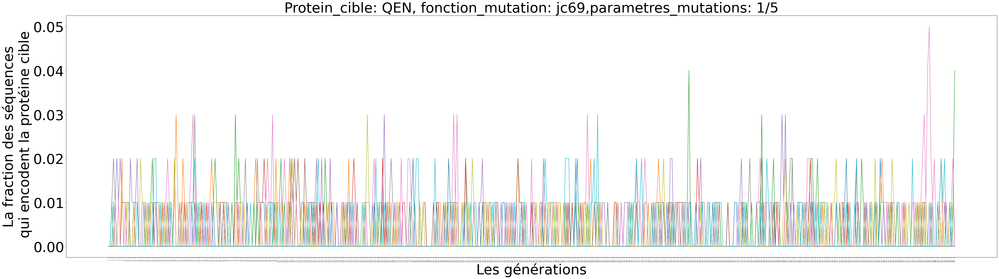

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_jc69_qen_5['generation'])
plt.plot(df_jc69_qen_5['individu1'].astype(float))
plt.plot(df_jc69_qen_5['individu2'].astype(float))
plt.plot(df_jc69_qen_5['individu3'].astype(float))
plt.plot(df_jc69_qen_5['individu4'].astype(float))
plt.plot(df_jc69_qen_5['individu5'].astype(float))
plt.plot(df_jc69_qen_5['individu6'].astype(float))
plt.plot(df_jc69_qen_5['individu7'].astype(float))
plt.plot(df_jc69_qen_5['individu8'].astype(float))
plt.plot(df_jc69_qen_5['individu9'].astype(float))
plt.plot(df_jc69_qen_5['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: QEN, fonction_mutation: jc69,parametres_mutations: 1/5',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_jc69_qen_5')

plt.show()





---


**protein_cible = 'QEN'**

**fonction_mutation = 'jc69'**

**parametres_mutations = [1/50]** 

---



In [ ]:
#Faites le trois fois avec jc69 en utilisant comme taux de mutations 1/50
protein_cible = 'QEN'
fonction_mutation = 'jc69'
parametres_mutations = [1/50]
n_total_generation = 500

#répéter 10x cette procédure
fraction_jc69_50_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.05154639175257732, 0.054945054945054944, 0.03571428571428571, 0.0125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_50_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_50_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_50_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_50_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.010309278350515464, 0.011111111111111112, 0.024691358024691357, 0.10666666666666667, 0.12857142857142856, 0.13846153846153847, 0.08333333333333333, 0.08928571428571429, 0.057692307692307696, 0.0625, 0.06521739130434782, 0.046511627906976744, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.06666666666666667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_50_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.041666666666666664, 0.047619047619047616, 0.15, 0.10526315789473684, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_jc69_50_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013333333333333334, 0.043478260869565216, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02702702702702703, 0.058823529411764705, 0.10714285714285714, 0.03571428571428571, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_50_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.03333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_jc69_50_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_50_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_50_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.027777777777777776, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1111111111111111, 0.2857142857142857, 0.2857142857142857, 0.2857142857142857, 0.14285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
df_jc69_qen_50 = pd.DataFrame({"individu1":fraction_jc69_50_1,
                          "individu2":fraction_jc69_50_2,
                          "individu3":fraction_jc69_50_3,
                          "individu4":fraction_jc69_50_4,
                          "individu5":fraction_jc69_50_5,
                          "individu6":fraction_jc69_50_6,
                          "individu7":fraction_jc69_50_7,
                          "individu8":fraction_jc69_50_8,
                          "individu9":fraction_jc69_50_9,
                          "individu10":fraction_jc69_50_10,
                          "Generation": range(501)})
df_jc69_qen_50.tail()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,496
497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,497
498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,498
499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,499
500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500


<Figure size 432x288 with 0 Axes>

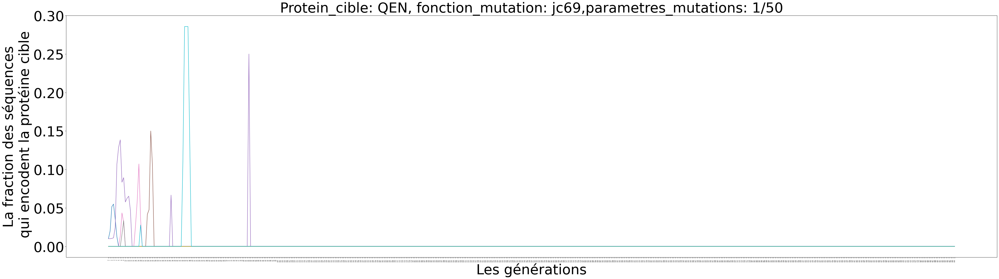

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_jc69_qen_50['Generation'])
plt.plot(df_jc69_qen_50['individu1'].astype(float))
plt.plot(df_jc69_qen_50['individu2'].astype(float))
plt.plot(df_jc69_qen_50['individu3'].astype(float))
plt.plot(df_jc69_qen_50['individu4'].astype(float))
plt.plot(df_jc69_qen_50['individu5'].astype(float))
plt.plot(df_jc69_qen_50['individu6'].astype(float))
plt.plot(df_jc69_qen_50['individu7'].astype(float))
plt.plot(df_jc69_qen_50['individu8'].astype(float))
plt.plot(df_jc69_qen_50['individu9'].astype(float))
plt.plot(df_jc69_qen_50['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: QEN, fonction_mutation: jc69,parametres_mutations: 1/50',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_jc69_qen_50')
plt.show()



---
**protein_cible = 'QEN'**

**fonction_mutation = 'jc69'**

**parametres_mutations = [1/500]**

---




In [ ]:
#Faites le trois fois avec jc69 en utilisant comme taux de mutations 1/500
protein_cible = 'QEN'
fonction_mutation = 'jc69'
parametres_mutations = [1/500]
n_total_generation = 500

#répéter 10x cette procédure
fraction_jc69_500_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_500_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.02857142857142857, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_jc69_500_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.021739130434782608, 0.027777777777777776, 0.03571428571428571, 0.10526315789473684, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_jc69_500_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_500_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
df_jc69_qen_500 = pd.DataFrame({"individu1":fraction_jc69_500_1,
                          "individu2":fraction_jc69_500_2,
                          "individu3":fraction_jc69_500_3,
                          "individu4":fraction_jc69_500_4,
                          "individu5":fraction_jc69_500_5,
                          "individu6":fraction_jc69_500_6,
                          "individu7":fraction_jc69_500_7,
                          "individu8":fraction_jc69_500_8,
                          "individu9":fraction_jc69_500_9,
                          "individu10":fraction_jc69_500_10,
                          "Generation": range(501)})
df_jc69_qen_500.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.021739,0.0,3
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028571,0.027778,0.0,4


<Figure size 432x288 with 0 Axes>

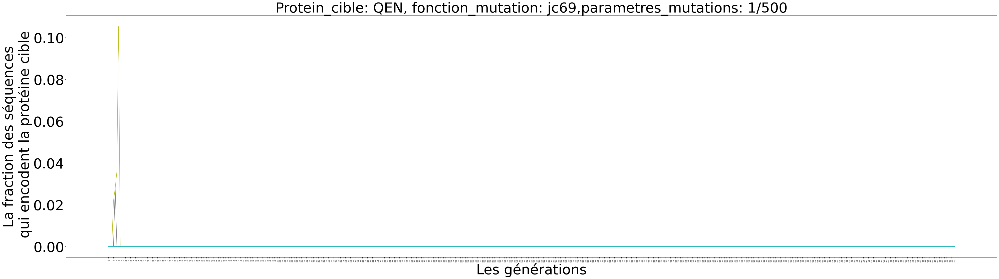

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_jc69_qen_500['Generation'])
plt.plot(df_jc69_qen_500['individu1'].astype(float))
plt.plot(df_jc69_qen_500['individu2'].astype(float))
plt.plot(df_jc69_qen_500['individu3'].astype(float))
plt.plot(df_jc69_qen_500['individu4'].astype(float))
plt.plot(df_jc69_qen_500['individu5'].astype(float))
plt.plot(df_jc69_qen_500['individu6'].astype(float))
plt.plot(df_jc69_qen_500['individu7'].astype(float))
plt.plot(df_jc69_qen_500['individu8'].astype(float))
plt.plot(df_jc69_qen_500['individu9'].astype(float))
plt.plot(df_jc69_qen_500['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: QEN, fonction_mutation: jc69,parametres_mutations: 1/500',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_jc69_qen_500')
plt.show()



---


**protein_cible = 'LAD'**

**fonction_mutation = 'jc69'**

**parametres_mutations = 1/5**


---



In [ ]:
#Faites le trois fois avec jc69 en utilisant comme taux de mutations 1/5
protein_cible = 'LAD'
fonction_mutation = 'jc69'
parametres_mutations = [0.2]
n_total_generation = 500

#répéter 10x cette procédure
fraction_jc69_lad_5_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.02, 0.02, 0.01, 0.02, 0.02, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.03, 0.0, 0.01, 0.02, 0.01, 0.04, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.02, 0.02, 0.0, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.04, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.03, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.02, 0.03, 0.01, 0.03, 0.0, 0.03, 0.02, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.02, 0.02, 0.01, 0.02, 0.0, 0.0, 0.01, 0.02, 0.03, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.02, 0.01, 0.02, 0.02, 0.02, 0.02, 0.03, 0.02, 0.02, 0.04, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 

In [ ]:
fraction_jc69_lad_5_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.03, 0.0, 0.01, 0.0, 0.0, 0.02, 0.04, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.04, 0.02, 0.03, 0.03, 0.01, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.03, 0.0, 0.01, 0.03, 0.02, 0.02, 0.0, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.01, 0.0, 0.02, 0.03, 0.01, 0.0, 0.02, 0.0, 0.01, 0.02, 0.03, 0.02, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.03, 0.01, 0.0, 0.01, 0.02, 0.02, 0.02, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.02, 0.01, 0.01, 0.04, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.03, 0.02, 0.01, 0.02, 0.01, 0.01, 0.02, 0.04, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.02, 0.01, 0.02, 0.0, 0.03, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.02, 0.05, 0.03, 0.04, 0.04, 0.

In [ ]:
fraction_jc69_lad_5_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.02, 0.01, 0.02, 0.04, 0.03, 0.0, 0.03, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.03, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.03, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.03, 0.01, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.03, 0.01, 0.0, 0.03, 0.02, 0.04, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.03, 0.02, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.03, 0.03, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.04, 0.04, 0.01, 0.0, 0.02, 0.03, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.02, 0.02, 0.03, 0.03, 0.03, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.03, 0.01, 0.02, 0.03, 0.03, 0.06, 0.03, 0.02, 0.0, 0.0, 0.01, 0.03, 0.02, 0.01, 0.0, 0.01, 0.02, 0.

In [ ]:
fraction_jc69_lad_5_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.02, 0.03, 0.04, 0.04, 0.06, 0.06, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.0, 0.02, 0.02, 0.02, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.02, 0.01, 0.02, 0.02, 0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.02, 0.02, 0.01, 0.0, 0.02, 0.02, 0.03, 0.02, 0.01, 0.0, 0.01, 0.02, 0.01, 0.02, 0.0, 0.0, 0.02, 0.04, 0.02, 0.03, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.04, 0.03, 0.01, 0.01, 0.01, 0.02, 0.02, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.03, 0.02, 0.03, 0.02, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.02, 0.02, 0.01, 

In [ ]:
fraction_jc69_lad_5_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.02, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.01, 0.02, 0.02, 0.05, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.02, 0.03, 0.02, 0.03, 0.0, 0.0, 0.0, 0.03, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.03, 0.05, 0.02, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.02, 0.03, 0.0, 0.03, 0.04, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.04, 0.03, 0.04, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.01, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.03, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.03, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.03, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.04, 0.01, 0.04, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0

In [ ]:
fraction_jc69_lad_5_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.02, 0.01, 0.01, 0.02, 0.02, 0.03, 0.0, 0.01, 0.03, 0.03, 0.01, 0.0, 0.02, 0.03, 0.02, 0.0, 0.0, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01, 0.03, 0.02, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.03, 0.02, 0.03, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.02, 0.0, 0.02, 0.0, 0.01, 0.03, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.02, 0.02, 0.02, 0.03, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.0, 0.03, 0.0, 0.03, 0.03, 0.03, 0.01, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.03, 0.02, 0.02, 0.02, 0.03, 0.03, 0.01, 0.03, 0.03, 0.01, 0.0, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.03, 0.03, 0.01, 0.0, 0.03, 0.02, 0.02, 0.02, 0.01, 0.0,

In [ ]:
fraction_jc69_lad_5_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.03, 0.02, 0.03, 0.03, 0.0, 0.02, 0.0, 0.02, 0.0, 0.02, 0.01, 0.0, 0.02, 0.02, 0.04, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.02, 0.04, 0.02, 0.02, 0.0, 0.0, 0.02, 0.03, 0.0, 0.02, 0.03, 0.04, 0.0, 0.0, 0.0, 0.0, 0.03, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.03, 0.03, 0.01, 0.0, 0.01, 0.01, 0.03, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.04, 0.02, 0.0, 0.01, 0.02, 0.02, 0.02, 0.02, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.03, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.03, 0.03, 0.02, 0.0, 0.01, 0.01, 0.0, 0.01, 0.03, 0.0, 0.02, 0.05, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.03, 0.02, 0.01, 0.02, 0.02, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.

In [ ]:
fraction_jc69_lad_5_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.03, 0.03, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.03, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.04, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.02, 0.02, 0.04, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.0, 0.0, 0.01, 0.01, 0.03, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.03, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.03, 0.04, 0.04, 0.04, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.03, 0.03, 0.02, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.02, 0.02, 0.03, 0.03, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.04, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.03, 0.0, 0.01, 0.0, 0.01, 0.05, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.01, 0.02, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_lad_5_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.01, 0.03, 0.02, 0.01, 0.0, 0.0, 0.0, 0.03, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.02, 0.03, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.03, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.0, 0.01, 0.02, 0.02, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.03, 0.03, 0.02, 0.01, 0.0, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.01, 0.02, 0.03, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.02, 0.03, 0.04, 0.01, 0.0, 0.0, 0.01, 0.03, 0.02, 0.01, 0.02, 0.01, 0.04, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.0, 0.02, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.04, 0.01, 0.03, 0.01, 0.01, 0.0, 0.03, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.03, 0.02, 0.01, 0.01, 0.01, 0.03, 0.01, 0.0, 0.02, 0.02, 0.01, 0.0, 0.04, 0.0, 0.02, 0.01, 0.01, 0.0, 

In [ ]:
fraction_jc69_lad_5_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_5_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.03, 0.02, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.04, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.03, 0.0, 0.0, 0.01, 0.03, 0.01, 0.01, 0.02, 0.01, 0.0, 0.02, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.0, 0.02, 0.02, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.02, 0.02, 0.01, 0.03, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.02, 0.02, 0.02, 0.02, 0.01, 0.03, 0.0, 0.0, 0.0, 0.0, 0.03, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.02, 0.02, 0.01, 0.0, 0.01, 0.04, 0.03, 0.02, 0.01, 0.01, 0.01, 0.02, 0.02, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.03, 0.02, 0.02, 0.0, 0.01, 0.04, 0.03, 0.01, 0.01, 0.0, 0.01, 0.03, 0.02, 0.0, 0.0, 0.03, 0.01, 0.01, 0

In [ ]:
# (4) Faire une figure avec sur l’axe des X les générations
# l’axe des Y le nombre la fraction des séquences qui encodent la protéine cible 
# avec 10 séquences de départ différentes

#4.1 Stocker les données sur DataFrame


In [ ]:
df_jc69_lad_5 = pd.DataFrame({"individu1":fraction_jc69_lad_5_1,
                          "individu2":fraction_jc69_lad_5_2,
                          "individu3":fraction_jc69_lad_5_3,
                          "individu4":fraction_jc69_lad_5_4,
                          "individu5":fraction_jc69_lad_5_5,
                          "individu6":fraction_jc69_lad_5_6,
                          "individu7":fraction_jc69_lad_5_7,
                          "individu8":fraction_jc69_lad_5_8,
                          "individu9":fraction_jc69_lad_5_9,
                          "individu10":fraction_jc69_lad_5_10,
                          "Generation": range(501)})
df_jc69_lad_5.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.00,0.00,0.02,0.00,0.01,0.03,0.00,0.0,0.00,0.00,0
1,0.02,0.00,0.01,0.00,0.02,0.01,0.02,0.0,0.01,0.00,1
2,0.02,0.00,0.02,0.02,0.00,0.01,0.02,0.0,0.03,0.00,2
3,0.01,0.03,0.04,0.00,0.00,0.00,0.01,0.0,0.02,0.00,3
4,0.02,0.00,0.03,0.00,0.00,0.00,0.00,0.0,0.01,0.01,4


<Figure size 432x288 with 0 Axes>

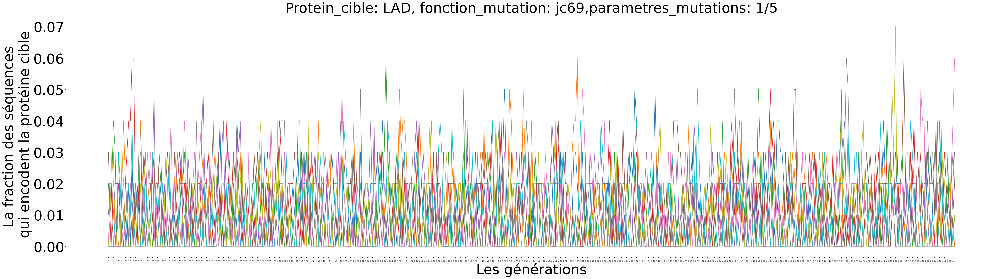

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_jc69_lad_5['Generation'])
plt.plot(df_jc69_lad_5['individu1'].astype(float))
plt.plot(df_jc69_lad_5['individu2'].astype(float))
plt.plot(df_jc69_lad_5['individu3'].astype(float))
plt.plot(df_jc69_lad_5['individu4'].astype(float))
plt.plot(df_jc69_lad_5['individu5'].astype(float))
plt.plot(df_jc69_lad_5['individu6'].astype(float))
plt.plot(df_jc69_lad_5['individu7'].astype(float))
plt.plot(df_jc69_lad_5['individu8'].astype(float))
plt.plot(df_jc69_lad_5['individu9'].astype(float))
plt.plot(df_jc69_lad_5['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: LAD, fonction_mutation: jc69,parametres_mutations: 1/5',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_jc69_lad_5')
plt.show()



---


**protein_cible = 'LAD'**

**fonction_mutation = 'jc69'**

**parametres_mutations = 1/50**


---



In [ ]:
#Faites le trois fois avec jc69 en utilisant comme taux de mutations 1/50
protein_cible = 'LAD'
fonction_mutation = 'jc69'
parametres_mutations = [1/50]
n_total_generation = 500

#répéter 10x cette procédure
fraction_jc69_lad_50_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.04, 0.0625, 0.08333333333333333, 0.1375, 0.25, 0.14492753623188406, 0.1076923076923077, 0.09836065573770492, 0.09090909090909091, 0.11320754716981132, 0.09433962264150944, 0.038461538461538464, 0.04, 0.020833333333333332, 0.022727272727272728, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03225806451612903, 0.0, 0.037037037037037035, 0.0, 0.0, 0.043478260869565216, 0.08695652173913043, 0.08695652173913043, 0.09523809523809523, 0.05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_lad_50_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02857142857142857, 0.11428571428571428, 0.1, 0.10344827586206896, 0.07407407407407407, 0.08, 0.08, 0.04, 0.08333333333333333, 0.125, 0.08695652173913043, 0.08695652173913043, 0.13636363636363635, 0.14285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.2, 0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_lad_50_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.018518518518518517, 0.0, 0.02040816326530612, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_lad_50_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.04, 0.031914893617021274, 0.09523809523809523, 0.0641025641025641, 0.043478260869565216, 0.06349206349206349, 0.0967741935483871, 0.06896551724137931, 0.018867924528301886, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.037037037037037035, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_lad_50_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.022727272727272728, 0.023809523809523808, 0.025, 0.02631578947368421, 0.08108108108108109, 0.2222222222222222, 0.16666666666666666, 0.2857142857142857, 0.34615384615384615, 0.4, 0.4782608695652174, 0.3181818181818182, 0.3181818181818182, 0.18181818181818182, 0.09523809523809523, 0.1111111111111111, 0.1875, 0.21428571428571427, 0.07142857142857142, 0.0, 0.0, 0.0, 0.1, 0.14285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_lad_50_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02127659574468085, 0.025, 0.1282051282051282, 0.10810810810810811, 0.17647058823529413, 0.16129032258064516, 0.1, 0.07142857142857142, 0.037037037037037035, 0.041666666666666664, 0.045454545454545456, 0.05263157894736842, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_lad_50_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.04, 0.03296703296703297, 0.022222222222222223, 0.012048192771084338, 0.012987012987012988, 0.027777777777777776, 0.04225352112676056, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.027777777777777776, 0.029411764705882353, 0.09375, 0.16129032258064516, 0.2857142857142857, 0.19230769230769232, 0.2, 0.13043478260869565, 0.043478260869565216, 0.14285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0625, 0.15384615384615385, 0.23076923076923078, 0.15384615384615385, 0.07692307692307693, 0.16666666666666666, 0.18181818181818182, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_lad_50_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.012195121951219513, 0.025974025974025976, 0.06756756756756757, 0.06060606060606061, 0.046153846153846156, 0.05084745762711865, 0.03571428571428571, 0.08163265306122448, 0.1111111111111111, 0.047619047619047616, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.041666666666666664, 0.18181818181818182, 0.09090909090909091, 0.09090909090909091, 0.1, 0.10526315789473684, 0.15789473684210525, 0.1111111111111111, 0.05555555555555555, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1111111111111111, 0.2222222222222222, 0.1111111111111111, 0.14285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.5, 0.5, 0.5, 0.5, 0.5, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [ ]:
fraction_jc69_lad_50_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.04, 0.03260869565217391, 0.033707865168539325, 0.023529411764705882, 0.012658227848101266, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03125, 0.037037037037037035, 0.07692307692307693, 0.19230769230769232, 0.08333333333333333, 0.047619047619047616, 0.0, 0.0, 0.0, 0.0, 0.0, 0.06666666666666667, 0.13333333333333333, 0.06666666666666667, 0.07142857142857142, 0.14285714285714285, 0.15384615384615385, 0.23076923076923078, 0.25, 0.45454545454545453, 0.45454545454545453, 0.5, 0.6, 0.4, 0.3333333333333333, 0.2222222222222222, 0.25, 0.625, 0.7142857142857143, 0.7142857142857143, 0.14285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_lad_50_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_50_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01818181818181818, 0.018867924528301886, 0.0392156862745098, 0.061224489795918366, 0.023809523809523808, 0.05, 0.02702702702702703, 0.02702702702702703, 0.05714285714285714, 0.125, 0.06451612903225806, 0.10714285714285714, 0.12, 0.125, 0.14285714285714285, 0.1111111111111111, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.07692307692307693, 0.08333333333333333, 0.25, 0.16666666666666666, 0.16666666666666666, 0.16666666666666666, 0.25, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
df_jc69_lad_50 = pd.DataFrame({"individu1":fraction_jc69_lad_50_1,
                          "individu2":fraction_jc69_lad_50_2,
                          "individu3":fraction_jc69_lad_50_3,
                          "individu4":fraction_jc69_lad_50_4,
                          "individu5":fraction_jc69_lad_50_5,
                          "individu6":fraction_jc69_lad_50_6,
                          "individu7":fraction_jc69_lad_50_7,
                          "individu8":fraction_jc69_lad_50_8,
                          "individu9":fraction_jc69_lad_50_9,
                          "individu10":fraction_jc69_lad_50_10,
                          "Generation": range(501)})
df_jc69_lad_50.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.010000,0.0,0.01,0.030000,0.0,0.0,0.010000,0.000000,0.010000,0.01,0
1,0.040000,0.0,0.01,0.040000,0.0,0.0,0.040000,0.000000,0.040000,0.01,1
2,0.062500,0.0,0.00,0.031915,0.0,0.0,0.032967,0.000000,0.032609,0.00,2
3,0.083333,0.0,0.00,0.095238,0.0,0.0,0.022222,0.000000,0.033708,0.00,3
4,0.137500,0.0,0.00,0.064103,0.0,0.0,0.012048,0.012195,0.023529,0.00,4


<Figure size 432x288 with 0 Axes>

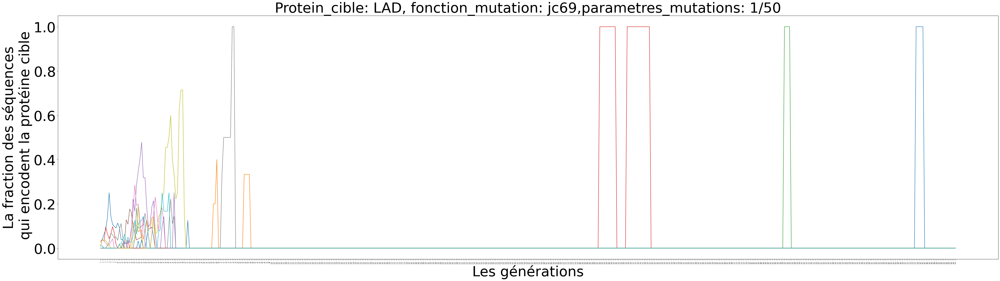

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_jc69_lad_50['Generation'])
plt.plot(df_jc69_lad_50['individu1'].astype(float))
plt.plot(df_jc69_lad_50['individu2'].astype(float))
plt.plot(df_jc69_lad_50['individu3'].astype(float))
plt.plot(df_jc69_lad_50['individu4'].astype(float))
plt.plot(df_jc69_lad_50['individu5'].astype(float))
plt.plot(df_jc69_lad_50['individu6'].astype(float))
plt.plot(df_jc69_lad_50['individu7'].astype(float))
plt.plot(df_jc69_lad_50['individu8'].astype(float))
plt.plot(df_jc69_lad_50['individu9'].astype(float))
plt.plot(df_jc69_lad_50['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: LAD, fonction_mutation: jc69,parametres_mutations: 1/50',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_jc69_lad_50')
plt.show()



---


**protein_cible = 'LAD'**

**fonction_mutation = 'jc69'**

**parametres_mutations = 1/500**


---



In [ ]:
#Faites le trois fois avec jc69 en utilisant comme taux de mutations 1/500
protein_cible = 'LAD'
fonction_mutation = 'jc69'
parametres_mutations = [1/500]
n_total_generation = 500

#répéter 10x cette procédure
fraction_jc69_lad_500_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.04, 0.06666666666666667, 0.07692307692307693, 0.041666666666666664, 0.05555555555555555, 0.06666666666666667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_lad_500_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.05, 0.056338028169014086, 0.0196078431372549, 0.027777777777777776, 0.041666666666666664, 0.058823529411764705, 0.07142857142857142, 0.2727272727272727, 0.14285714285714285, 0.6, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [ ]:
fraction_jc69_lad_500_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_lad_500_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_lad_500_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_lad_500_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.0273972602739726, 0.020833333333333332, 0.030303030303030304, 0.07407407407407407, 0.058823529411764705, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_jc69_lad_500_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_jc69_lad_500_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.014084507042253521, 0.0425531914893617, 0.058823529411764705, 0.04, 0.15789473684210525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_lad_500_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.04285714285714286, 0.07407407407407407, 0.15789473684210525, 0.19230769230769232, 0.15, 0.17647058823529413, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_jc69_lad_500_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_jc69_lad_500_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
df_jc69_lad_500 = pd.DataFrame({"individu1":fraction_jc69_lad_500_1,
                          "individu2":fraction_jc69_lad_500_2,
                          "individu3":fraction_jc69_lad_500_3,
                          "individu4":fraction_jc69_lad_500_4,
                          "individu5":fraction_jc69_lad_500_5,
                          "individu6":fraction_jc69_lad_500_6,
                          "individu7":fraction_jc69_lad_500_7,
                          "individu8":fraction_jc69_lad_500_8,
                          "individu9":fraction_jc69_lad_500_9,
                          "individu10":fraction_jc69_lad_500_10,
                          "Generation": range(501)})
df_jc69_lad_500.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.010000,0.030000,0.0,0.0,0.0,0.010000,0.0,0.010000,0.010000,0.0,0
1,0.040000,0.050000,0.0,0.0,0.0,0.010000,0.0,0.020000,0.020000,0.0,1
2,0.066667,0.056338,0.0,0.0,0.0,0.027397,0.0,0.014085,0.042857,0.0,2
3,0.076923,0.019608,0.0,0.0,0.0,0.020833,0.0,0.042553,0.074074,0.0,3
4,0.041667,0.027778,0.0,0.0,0.0,0.030303,0.0,0.058824,0.157895,0.0,4


<Figure size 432x288 with 0 Axes>

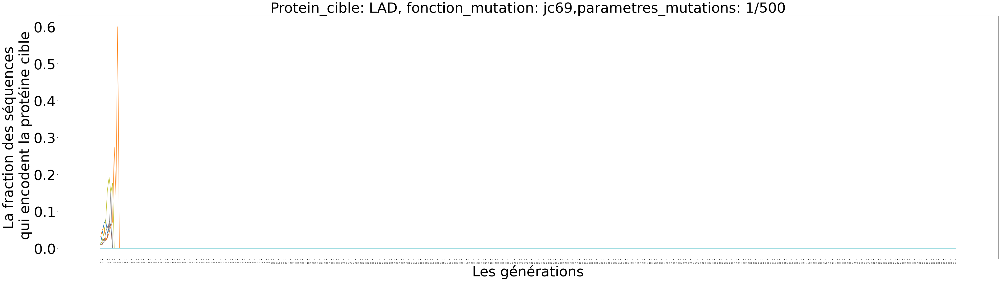

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_jc69_lad_500['Generation'])
plt.plot(df_jc69_lad_500['individu1'].astype(float))
plt.plot(df_jc69_lad_500['individu2'].astype(float))
plt.plot(df_jc69_lad_500['individu3'].astype(float))
plt.plot(df_jc69_lad_500['individu4'].astype(float))
plt.plot(df_jc69_lad_500['individu5'].astype(float))
plt.plot(df_jc69_lad_500['individu6'].astype(float))
plt.plot(df_jc69_lad_500['individu7'].astype(float))
plt.plot(df_jc69_lad_500['individu8'].astype(float))
plt.plot(df_jc69_lad_500['individu9'].astype(float))
plt.plot(df_jc69_lad_500['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: LAD, fonction_mutation: jc69,parametres_mutations: 1/500',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_jc69_lad_500')
plt.show()



---


**protein_cible = 'QEN'**

**fonction_mutation = "k2p"**

**parametres_mutations = (1/50,1/10)**


---



In [ ]:
#Faites le trois fois avec k2p en utilisant comme taux de mutations [1/50,1/10]
protein_cible = 'QEN'
fonction_mutation = 'k2p'
parametres_mutations = [1/50,1/10]
n_total_generation = 500

#répéter 10x cette procédure
fraction_k2p_qen_50_10_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.01, 0.0,

In [ ]:
fraction_k2p_qen_50_10_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01

In [ ]:
fraction_k2p_qen_50_10_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_k2p_qen_50_10_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_k2p_qen_50_10_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_k2p_qen_50_10_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 

In [ ]:
fraction_k2p_qen_50_10_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_k2p_qen_50_10_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [ ]:
fraction_k2p_qen_50_10_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 

In [ ]:
fraction_k2p_qen_50_10_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_10_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
df_k2p_qen_50_10 = pd.DataFrame({"individu1":fraction_k2p_qen_50_10_1,
                          "individu2":fraction_k2p_qen_50_10_2,
                          "individu3":fraction_k2p_qen_50_10_3,
                          "individu4":fraction_k2p_qen_50_10_4,
                          "individu5":fraction_k2p_qen_50_10_5,
                          "individu6":fraction_k2p_qen_50_10_6,
                          "individu7":fraction_k2p_qen_50_10_7,
                          "individu8":fraction_k2p_qen_50_10_8,
                          "individu9":fraction_k2p_qen_50_10_9,
                          "individu10":fraction_k2p_qen_50_10_10,
                          "Generation": range(501)})
df_k2p_qen_50_10.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.01,0
1,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,1
2,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.01,2
3,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,3
4,0.0,0.0,0.0,0.01,0.0,0.01,0.0,0.0,0.0,0.00,4


<Figure size 432x288 with 0 Axes>

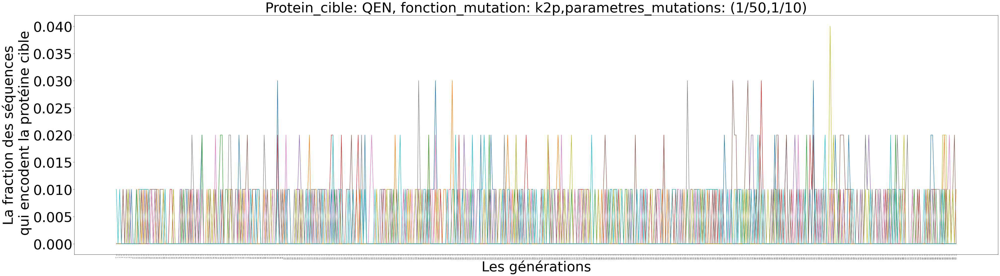

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_k2p_qen_50_10['Generation'])
plt.plot(df_k2p_qen_50_10['individu1'].astype(float))
plt.plot(df_k2p_qen_50_10['individu2'].astype(float))
plt.plot(df_k2p_qen_50_10['individu3'].astype(float))
plt.plot(df_k2p_qen_50_10['individu4'].astype(float))
plt.plot(df_k2p_qen_50_10['individu5'].astype(float))
plt.plot(df_k2p_qen_50_10['individu6'].astype(float))
plt.plot(df_k2p_qen_50_10['individu7'].astype(float))
plt.plot(df_k2p_qen_50_10['individu8'].astype(float))
plt.plot(df_k2p_qen_50_10['individu9'].astype(float))
plt.plot(df_k2p_qen_50_10['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: QEN, fonction_mutation: k2p,parametres_mutations: (1/50,1/10)',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_k2p_qen_50_10')
plt.show()



---


**protein_cible = 'QEN'**

**fonction_mutation = "k2p"**

**parametres_mutations = ((1/5, 1/100)**


---



In [ ]:
#Faites le trois fois avec k2p en utilisant comme taux de mutations [1/5,1/100]
protein_cible = 'QEN'
fonction_mutation = 'k2p'
parametres_mutations = [1/5,1/100]
n_total_generation = 500

#répéter 10x cette procédure
fraction_k2p_qen_5_100_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.01, 0.03, 0.0, 0.01, 0

In [ ]:
fraction_k2p_qen_5_100_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.0, 0.02, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.02, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0

In [ ]:
fraction_k2p_qen_5_100_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.02, 0.02, 0.01, 0.01, 0.0, 

In [ ]:
fraction_k2p_qen_5_100_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.03, 0.02, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 

In [ ]:
fraction_k2p_qen_5_100_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0

In [ ]:
fraction_k2p_qen_5_100_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.02, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0

In [ ]:
fraction_k2p_qen_5_100_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
fraction_k2p_qen_5_100_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.03, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.02, 0.01, 0.02, 0.02, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0

In [ ]:
fraction_k2p_qen_5_100_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.03, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.03, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01,

In [ ]:
fraction_k2p_qen_5_100_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_5_100_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.03, 0.06, 0.04, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.05, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 

In [ ]:
df_k2p_qen_5_100 = pd.DataFrame({"individu1":fraction_k2p_qen_5_100_1,
                          "individu2":fraction_k2p_qen_5_100_2,
                          "individu3":fraction_k2p_qen_5_100_3,
                          "individu4":fraction_k2p_qen_5_100_4,
                          "individu5":fraction_k2p_qen_5_100_5,
                          "individu6":fraction_k2p_qen_5_100_6,
                          "individu7":fraction_k2p_qen_5_100_7,
                          "individu8":fraction_k2p_qen_5_100_8,
                          "individu9":fraction_k2p_qen_5_100_9,
                          "individu10":fraction_k2p_qen_5_100_10,
                          "Generation": range(501)})
df_k2p_qen_5_100.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0
1,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.01,0.01,0.01,1
2,0.0,0.0,0.00,0.01,0.00,0.0,0.0,0.00,0.00,0.02,2
3,0.0,0.0,0.01,0.00,0.00,0.0,0.0,0.00,0.00,0.00,3
4,0.0,0.0,0.01,0.00,0.01,0.0,0.0,0.01,0.00,0.00,4


<Figure size 432x288 with 0 Axes>

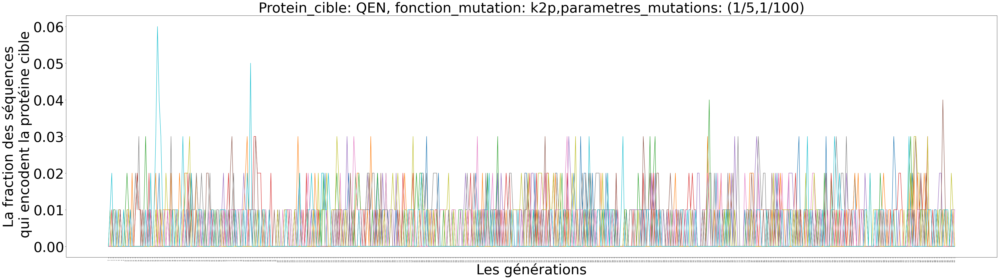

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_k2p_qen_5_100['Generation'])
plt.plot(df_k2p_qen_5_100['individu1'].astype(float))
plt.plot(df_k2p_qen_5_100['individu2'].astype(float))
plt.plot(df_k2p_qen_5_100['individu3'].astype(float))
plt.plot(df_k2p_qen_5_100['individu4'].astype(float))
plt.plot(df_k2p_qen_5_100['individu5'].astype(float))
plt.plot(df_k2p_qen_5_100['individu6'].astype(float))
plt.plot(df_k2p_qen_5_100['individu7'].astype(float))
plt.plot(df_k2p_qen_5_100['individu8'].astype(float))
plt.plot(df_k2p_qen_5_100['individu9'].astype(float))
plt.plot(df_k2p_qen_5_100['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: QEN, fonction_mutation: k2p,parametres_mutations: (1/5,1/100)',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_k2p_qen_5_100')
plt.show()



---


**protein_cible = 'QEN'**

**fonction_mutation = "k2p"**

**parametres_mutations = (1/50, 1/100)**


---



In [ ]:
#Faites le trois fois avec k2p en utilisant comme taux de mutations [1/50,1/100]
protein_cible = 'QEN'
fonction_mutation = 'k2p'
parametres_mutations = [1/50,1/100]
n_total_generation = 500

#répéter 10x cette procédure
fraction_k2p_qen_50_100_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01098901098901099, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013333333333333334, 0.013513513513513514, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014925373134328358, 0.015151515151515152, 0.015384615384615385, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01694915254237288, 0.03389830508474576, 0.01694915254237288, 0.01694915254237288, 0.03389830508474576, 0.05172413793103448, 0.034482758620689655, 0.034482758620689655, 0.06896551724137931, 0.03508771929824561, 0.017543859649122806, 0.017857142857142856, 0.017857142857142856, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02127659574468085, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.021739130434782608, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [ ]:
fraction_k2p_qen_50_100_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01020408163265306, 0.01020408163265306, 0.020618556701030927, 0.020618556701030927, 0.05154639175257732, 0.030927835051546393, 0.02127659574468085, 0.02127659574468085, 0.031914893617021274, 0.021505376344086023, 0.011111111111111112, 0.0, 0.0, 0.0, 0.0, 0.011235955056179775, 0.011363636363636364, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014492753623188406, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.016129032258064516, 0.01639344262295082, 0.016666666666666666, 0.03333333333333333, 0.05, 0.03389830508474576, 0.03389830508474576, 0.017241379310344827, 0.07142857142857142, 0.017857142857142856, 0.0, 0.0, 0.0, 0.0, 0.0196078431372549, 0.058823529411764705, 0.11764705882352941, 0.17647058823529413, 0.06, 0.1, 0.08, 0.04, 0.02, 0.04081632653061224, 0.04081632653061224, 0.04081632653061224, 0.061224489795918366, 0.0625, 0.0425531914893617, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_k2p_qen_50_100_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013888888888888888, 0.0, 0.0, 0.014492753623188406, 0.014925373134328358, 0.0, 0.0, 0.015151515151515152, 0.015151515151515152, 0.015151515151515152, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.018867924528301886, 0.03773584905660377, 0.057692307692307696, 0.038461538461538464, 0.038461538461538464, 0.019230769230769232, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02040816326530612, 0.02040816326530612, 0.020833333333333332, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [ ]:
fraction_k2p_qen_50_100_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.030612244897959183, 0.03125, 0.03125, 0.06382978723404255, 0.0425531914893617, 0.06382978723404255, 0.07526881720430108, 0.10752688172043011, 0.08888888888888889, 0.13333333333333333, 0.1590909090909091, 0.10227272727272728, 0.09302325581395349, 0.07058823529411765, 0.09411764705882353, 0.11904761904761904, 0.06097560975609756, 0.10975609756097561, 0.0975609756097561, 0.08641975308641975, 0.1, 0.08860759493670886, 0.11688311688311688, 0.11842105263157894, 0.13333333333333333, 0.06666666666666667, 0.04, 0.02666666666666667, 0.05405405405405406, 0.06756756756756757, 0.06756756756756757, 0.05405405405405406, 0.08108108108108109, 0.10810810810810811, 0.1506849315068493, 0.1527777777777778, 0.1388888888888889, 0.12857142857142856, 0.14492753623188406, 0.14492753623188406, 0.11764705882352941, 0.058823529411764705, 0.058823529411764705, 0.029411764705882353, 0.029411764705882353, 0.029850746268656716, 0.046153846153846156, 0.09375, 0.1111111111111111, 0.14754098360655737, 0.16

In [ ]:
fraction_k2p_qen_50_100_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.010752688172043012, 0.03296703296703297, 0.02197802197802198, 0.03296703296703297, 0.03296703296703297, 0.03296703296703297, 0.045454545454545456, 0.022727272727272728, 0.05813953488372093, 0.05813953488372093, 0.046511627906976744, 0.058823529411764705, 0.07058823529411765, 0.08235294117647059, 0.047058823529411764, 0.012048192771084338, 0.012345679012345678, 0.0125, 0.0, 0.0, 0.0, 0.0125, 0.01282051282051282, 0.0, 0.0, 0.013157894736842105, 0.013157894736842105, 0.013333333333333334, 0.013333333333333334, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015384615384615385, 0.03125, 0.015873015873015872, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01639344262295082, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.024390243902439025, 0.024390243902439025, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
fraction_k2p_qen_50_100_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.012195121951219513, 0.0, 0.0, 0.0, 0.0125, 0.0125, 0.0, 0.0, 0.0, 0.025, 0.05063291139240506, 0.0641025641025641, 0.0641025641025641, 0.07692307692307693, 0.038461538461538464, 0.012987012987012988, 0.0, 0.013157894736842105, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029411764705882353, 0.029850746268656716, 0.06060606060606061, 0.09090909090909091, 0.1076923076923077, 0.15384615384615385, 0.1875, 0.21875, 0.265625, 0.12698412698412698, 0.1111111111111111, 0.07936507936507936, 0.04838709677419355, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.018518518518518517, 0.038461538461538464, 0.0, 0.0, 0.0, 0.0, 0.02, 0.04, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.023809523809523808, 0.04878048780487805, 0.04878048780487805, 0.0512820512820512

In [ ]:
fraction_k2p_qen_50_100_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.010101010101010102, 0.010101010101010102, 0.0, 0.0, 0.010416666666666666, 0.0, 0.0, 0.0, 0.0, 0.0, 0.010869565217391304, 0.0, 0.0, 0.0, 0.0, 0.011111111111111112, 0.011235955056179775, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.011494252873563218, 0.023255813953488372, 0.024096385542168676, 0.0, 0.0125, 0.0125, 0.0125, 0.02564102564102564, 0.02564102564102564, 0.038461538461538464, 0.038461538461538464, 0.012987012987012988, 0.02631578947368421, 0.013157894736842105, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014084507042253521, 0.014084507042253521, 0.014492753623188406, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_k2p_qen_50_100_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0125, 0.0125, 0.0125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013513513513513514, 0.0273972602739726, 0.0410958904109589, 0.05555555555555555, 0.1388888888888889, 0.1267605633802817, 0.08695652173913043, 0.1323529411764706, 0.1323529411764706, 0.07352941176470588, 0.058823529411764705, 0.07352941176470588, 0.14705882352941177, 0.08823529411764706, 0.08823529411764706, 0.014925373134328358, 0.015151515151515152, 0.06153846153846154, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.018867924528301886, 0.018867924528301886, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.021739130434782608, 0.021739130434782608, 0.0, 0.0, 0.022727272727272728, 0.022727272727272728, 0.045454545454545456, 0.022727272727272728, 0.022727272727272728, 0.045454545454545456, 0.06818181818181818, 0.06818181818181818, 0.093023

In [ ]:
fraction_k2p_qen_50_100_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.011235955056179775, 0.011363636363636364, 0.0, 0.0, 0.0, 0.0, 0.0, 0.011764705882352941, 0.023529411764705882, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013513513513513514, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015873015873015872, 0.0, 0.0, 0.016129032258064516, 0.01639344262295082, 0.03333333333333333, 0.01694915254237288, 0.017241379310344827, 0.017241379310344827, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.038461538461538464, 0.038461538461538464, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_k2p_qen_50_100_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_qen_50_100_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0125, 0.025, 0.013157894736842105, 0.013157894736842105, 0.02666666666666667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01639344262295082, 0.0, 0.0, 0.016666666666666666, 0.01694915254237288, 0.01694915254237288, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.022222222222222223, 0.022222222222222223, 0.022727272727272728, 0.07142857142857142, 0.09523809523809523, 0.07317073170731707, 0.04878048780487805, 0.04878048780487805, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02631578947368421, 0.13157894736842105, 0.21621621621621623, 0.13513513513513514, 0.21621621621621623, 0.13513513513513514, 0.13513513513513514, 0.05405405405405406, 0.08108108108108109, 0.0540540

In [ ]:
df_k2p_qen_50_100 = pd.DataFrame({"individu1":fraction_k2p_qen_50_100_1,
                          "individu2":fraction_k2p_qen_50_100_2,
                          "individu3":fraction_k2p_qen_50_100_3,
                          "individu4":fraction_k2p_qen_50_100_4,
                          "individu5":fraction_k2p_qen_50_100_5,
                          "individu6":fraction_k2p_qen_50_100_6,
                          "individu7":fraction_k2p_qen_50_100_7,
                          "individu8":fraction_k2p_qen_50_100_8,
                          "individu9":fraction_k2p_qen_50_100_9,
                          "individu10":fraction_k2p_qen_50_100_10,
                          "Generation": range(501)})
df_k2p_qen_50_100.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.0,0.000000,0.0,0.010000,0.0,0.0,0.000000,0.0,0.0,0.0,0
1,0.0,0.000000,0.0,0.020000,0.0,0.0,0.000000,0.0,0.0,0.0,1
2,0.0,0.000000,0.0,0.030612,0.0,0.0,0.010000,0.0,0.0,0.0,2
3,0.0,0.000000,0.0,0.031250,0.0,0.0,0.010101,0.0,0.0,0.0,3
4,0.0,0.010204,0.0,0.031250,0.0,0.0,0.010101,0.0,0.0,0.0,4


<Figure size 432x288 with 0 Axes>

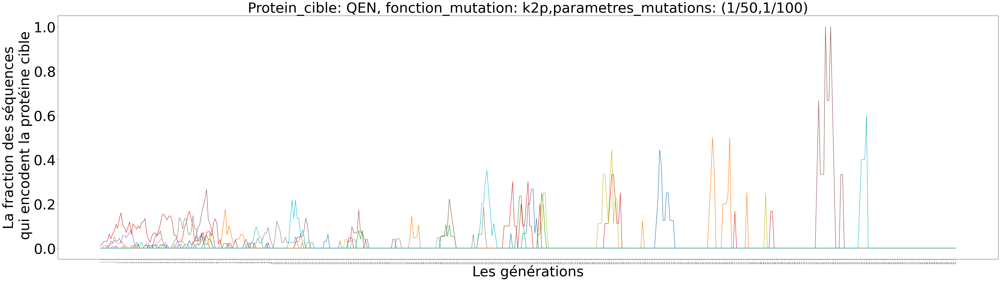

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_k2p_qen_50_100['Generation'])
plt.plot(df_k2p_qen_50_100['individu1'].astype(float))
plt.plot(df_k2p_qen_50_100['individu2'].astype(float))
plt.plot(df_k2p_qen_50_100['individu3'].astype(float))
plt.plot(df_k2p_qen_50_100['individu4'].astype(float))
plt.plot(df_k2p_qen_50_100['individu5'].astype(float))
plt.plot(df_k2p_qen_50_100['individu6'].astype(float))
plt.plot(df_k2p_qen_50_100['individu7'].astype(float))
plt.plot(df_k2p_qen_50_100['individu8'].astype(float))
plt.plot(df_k2p_qen_50_100['individu9'].astype(float))
plt.plot(df_k2p_qen_50_100['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: QEN, fonction_mutation: k2p,parametres_mutations: (1/50,1/100)',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_k2p_qen_50_100')
plt.show()



---


**protein_cible = 'LAD'**

**fonction_mutation = "k2p"**

**parametres_mutations = (1/50,1/10)**


---



In [ ]:
#Faites le trois fois avec k2p en utilisant comme taux de mutations [1/50,1/10]
protein_cible = 'LAD'
fonction_mutation = 'k2p'
parametres_mutations = [1/50,1/10]
n_total_generation = 500

#répéter 10x cette procédure
fraction_k2p_lad_50_10_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.03, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.01, 0.02, 0.02, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.02, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.03, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.03, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.03, 0.0, 0.0, 0.01, 0.02, 0.03, 0.03, 0.02, 0.0, 0.01, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.03, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.03, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.02, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.02, 0.01, 0.04, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.03, 0.0, 0.01, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 

In [ ]:
fraction_k2p_lad_50_10_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.01, 0.0, 0.02, 0.03, 0.04, 0.03, 0.03, 0.02, 0.01, 0.01, 0.0, 0.01, 0.02, 0.02, 0.01, 0.01, 0.03, 0.02, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.04, 0.0, 0.01, 0.01, 0.02, 0.02, 0.03, 0.04, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.04, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.03, 0.03, 0.02, 0.02, 0.01, 0.01, 0.02, 0.02, 0.01, 0.03, 0.0, 0.01, 0.02, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.0, 0.02, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.03, 0.03, 0.0, 0.02, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.04, 0.03, 0.03, 0.02, 0.01, 0.02, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0

In [ ]:
fraction_k2p_lad_50_10_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.0, 0.02, 0.02, 0.02, 0.0, 0.02, 0.03, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.03, 0.02, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.03, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.03, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.03, 0.03, 0.01, 0.02, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.02, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.02, 0.03, 0.01, 0.01, 0.04, 0.03, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.02, 0.01, 0.03, 0.03, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.02, 0.01, 0.03, 0.03, 0.04, 0.02, 0.01, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.03, 0.01, 0.0, 0.0, 0.01, 0.03, 0.01, 0.04, 0.03, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 

In [ ]:
fraction_k2p_lad_50_10_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.02, 0.02, 0.0, 0.0, 0.03, 0.04, 0.02, 0.02, 0.01, 0.03, 0.0, 0.01, 0.01, 0.0, 0.03, 0.0, 0.03, 0.03, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.0, 0.01, 0.03, 0.03, 0.05, 0.0, 0.0, 0.0, 0.03, 0.02, 0.02, 0.0, 0.01, 0.03, 0.03, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.01, 0.02, 0.0, 0.03, 0.0, 0.03, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.04, 0.03, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.03, 0.01, 0.01, 0.03, 0.02, 0.01, 0.01, 0.02, 0.02, 0.03, 0.02, 0.01, 0.0, 0.01, 0.01, 0.04, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.03, 0.03, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.01, 0.01, 0.01, 0.0, 0.01, 0.03, 0.02, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.03, 0.01, 0.01, 0.0, 0.03, 0.0

In [ ]:
fraction_k2p_lad_50_10_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.02, 0.04, 0.04, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.01, 0.03, 0.01, 0.0, 0.02, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.02, 0.02, 0.01, 0.02, 0.01, 0.0, 0.0, 0.02, 0.01, 0.02, 0.0, 0.0, 0.02, 0.04, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.03, 0.03, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.03, 0.03, 0.01, 0.03, 0.01, 0.02, 0.02, 0.01, 0.01, 0.02, 0.02, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.01, 0.02, 0.0, 0.04, 0.02, 0.04, 0.02, 0.04, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.01, 0.02, 0.02, 0.02, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.03, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 

In [ ]:
fraction_k2p_lad_50_10_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.01, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.03, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.02, 0.02, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.04, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.01, 0.01, 0.02, 0.02, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.02, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.03, 0.01, 0.03, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.03, 0.03, 0.01, 0.0, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.04, 0.04, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.03, 0.04, 0.01, 0.0, 0.02, 0.02, 0.01, 0.02, 0.02, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0

In [ ]:
fraction_k2p_lad_50_10_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.02, 0.02, 0.01, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.04, 0.01, 0.01, 0.01, 0.0, 0.01, 0.04, 0.01, 0.02, 0.0, 0.01, 0.02, 0.0, 0.0, 0.03, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.02, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.02, 0.0, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.03, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.02, 0.0, 0.01, 0.02, 0.01, 0.02, 0.01, 0.0, 0.02, 0.02, 0.01, 0.01, 0.02, 0.02, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0

In [ ]:
fraction_k2p_lad_50_10_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.02, 0.03, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.02, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.02, 0.0, 0.0, 0.01, 0.02, 0.02, 0.02, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.02, 0.02, 0.0, 0.01, 0.02, 0.01, 0.03, 0.03, 0.01, 0.01, 0.0, 0.0, 0.02, 0.03, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.03, 0.01, 0.03, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.0, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.02, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.03, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.03

In [ ]:
fraction_k2p_lad_50_10_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.02, 0.03, 0.01, 0.01, 0.01, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.02, 0.0, 0.01, 0.01, 0.02, 0.0, 0.01, 0.03, 0.0, 0.0, 0.02, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.02, 0.01, 0.0, 0.0, 0.02, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.03, 0.0, 0.0, 0.01, 0.02, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.04, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.03, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.02, 0.03, 0.0, 0.01, 0.01, 0.0, 0.0, 0.03, 0.01, 0.01, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.02, 0.01, 0.01, 0.0, 0.0, 0.01, 0.03, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.03, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.02, 0.0, 0.01, 0.0, 0

In [ ]:
fraction_k2p_lad_50_10_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_10_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.04, 0.01, 0.01, 0.0, 0.02, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.04, 0.04, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.02, 0.02, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.02, 0.01, 0.01, 0.03, 0.03, 0.02, 0.02, 0.05, 0.02, 0.01, 0.01, 0.0, 0.0, 0.03, 0.01, 0.0, 0.0, 0.0, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.01, 0.0, 0.03, 0.01, 0.01, 0.01, 0.03, 0.02, 0.02, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.02, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.02, 0.03, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.02, 0.02, 0.01, 0.03, 0.0, 0.01, 0.01, 0.04, 0.01, 0.0, 0.0, 0.03, 0.01, 0.01, 0.02, 0.02, 0.01, 0.0, 0.01, 0.0, 0.02, 0.02, 0.02, 0.02, 0.0, 0.02, 0.0, 0.01, 0.03, 0.0, 0.0, 0.01, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.03,

In [ ]:
df_k2p_lad_50_10 = pd.DataFrame({"individu1":fraction_k2p_lad_50_10_1,
                          "individu2":fraction_k2p_lad_50_10_2,
                          "individu3":fraction_k2p_lad_50_10_3,
                          "individu4":fraction_k2p_lad_50_10_4,
                          "individu5":fraction_k2p_lad_50_10_5,
                          "individu6":fraction_k2p_lad_50_10_6,
                          "individu7":fraction_k2p_lad_50_10_7,
                          "individu8":fraction_k2p_lad_50_10_8,
                          "individu9":fraction_k2p_lad_50_10_9,
                          "individu10":fraction_k2p_lad_50_10_10,
                          "Generation": range(501)})
df_k2p_lad_50_10.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.01,0.01,0.01,0.01,0.02,0.01,0.00,0.01,0.02,0.01,0
1,0.02,0.00,0.00,0.00,0.04,0.01,0.00,0.00,0.03,0.01,1
2,0.01,0.01,0.00,0.01,0.04,0.01,0.00,0.00,0.01,0.01,2
3,0.00,0.00,0.02,0.00,0.00,0.02,0.00,0.00,0.01,0.02,3
4,0.00,0.02,0.02,0.00,0.00,0.00,0.01,0.03,0.01,0.00,4


<Figure size 432x288 with 0 Axes>

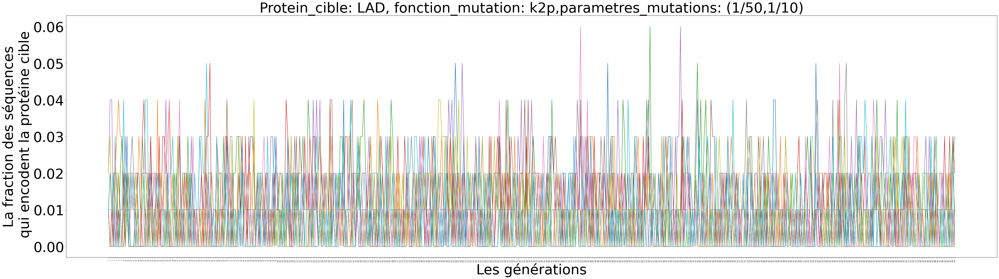

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_k2p_lad_50_10['Generation'])
plt.plot(df_k2p_lad_50_10['individu1'].astype(float))
plt.plot(df_k2p_lad_50_10['individu2'].astype(float))
plt.plot(df_k2p_lad_50_10['individu3'].astype(float))
plt.plot(df_k2p_lad_50_10['individu4'].astype(float))
plt.plot(df_k2p_lad_50_10['individu5'].astype(float))
plt.plot(df_k2p_lad_50_10['individu6'].astype(float))
plt.plot(df_k2p_lad_50_10['individu7'].astype(float))
plt.plot(df_k2p_lad_50_10['individu8'].astype(float))
plt.plot(df_k2p_lad_50_10['individu9'].astype(float))
plt.plot(df_k2p_lad_50_10['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: LAD, fonction_mutation: k2p,parametres_mutations: (1/50,1/10)',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_k2p_lad_50_10')
plt.show()



```
# 此内容为代码格式
```



---


**protein_cible = 'LAD'**

**fonction_mutation = "k2p"**

**parametres_mutations = ((1/5, 1/100)**


---



In [ ]:
#Faites le trois fois avec k2p en utilisant comme taux de mutations [1/5,1/100]
protein_cible = 'LAD'
fonction_mutation = 'k2p'
parametres_mutations = [1/5,1/100]
n_total_generation = 500

#répéter 10x cette procédure
fraction_k2p_lad_5_100_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.01, 0.01, 0.03, 0.03, 0.07, 0.01, 0.02, 0.03, 0.02, 0.0, 0.03, 0.0, 0.0, 0.01, 0.02, 0.03, 0.04, 0.04, 0.02, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.04, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.0, 0.02, 0.03, 0.0, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.02, 0.02, 0.01, 0.01, 0.02, 0.0, 0.01, 0.01, 0.06, 0.03, 0.03, 0.02, 0.02, 0.0, 0.01, 0.01, 0.05, 0.05, 0.02, 0.01, 0.01, 0.03, 0.02, 0.05, 0.02, 0.02, 0.04, 0.01, 0.03, 0.04, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.03, 0.04, 0.03, 0.01, 0.02, 0.01, 0.05, 0.02, 0.02, 0.04, 0.05, 0.04, 0.03, 0.04, 0.03, 0.02, 0.0, 0.02, 0.02, 0.0, 0.0, 0.02, 0.01, 0.01, 0.02, 0.02, 0.0, 0.0, 0.0, 0.02, 0.01, 0.03, 0.01, 0.01, 0.02, 0.03, 0.02

In [ ]:
fraction_k2p_lad_5_100_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.02, 0.02, 0.02, 0.01, 0.04, 0.04, 0.02, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.04, 0.02, 0.01, 0.01, 0.02, 0.02, 0.02, 0.02, 0.01, 0.01, 0.03, 0.02, 0.02, 0.03, 0.02, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.02, 0.02, 0.04, 0.04, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.03, 0.0, 0.01, 0.01, 0.01, 0.02, 0.04, 0.03, 0.0, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.02, 0.02, 0.0, 0.0, 0.0, 0.04, 0.02, 0.02, 0.01, 0.04, 0.03, 0.02, 0.02, 0.04, 0.0, 0.01, 0.03, 0.01, 0.02, 0.01, 0.0, 0.01, 0.03, 0.01, 0.02, 0.03, 0.0, 0.0, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.0, 0.02, 0.01, 0.0, 0.02, 0.01, 0.01, 0.03, 0.02, 0.03, 0.01, 0.02, 0.03, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.02, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.03, 0.03, 0.01, 0.02, 0.01, 0.04, 0.01, 0.02, 0.01, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01,

In [ ]:
fraction_k2p_lad_5_100_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.02, 0.0, 0.03, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.03, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.02, 0.0, 0.03, 0.01, 0.02, 0.01, 0.0, 0.03, 0.02, 0.0, 0.03, 0.0, 0.01, 0.02, 0.03, 0.02, 0.05, 0.07, 0.03, 0.01, 0.02, 0.02, 0.01, 0.01, 0.02, 0.0, 0.0, 0.02, 0.0, 0.01, 0.0, 0.01, 0.01, 0.05, 0.02, 0.03, 0.01, 0.01, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.03, 0.02, 0.0, 0.02, 0.02, 0.01, 0.0, 0.02, 0.01, 0.01, 0.01, 0.02, 0.02, 0.04, 0.03, 0.02, 0.02, 0.02, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.03, 0.06, 0.03, 0.05, 0.02, 0.01, 0.04, 0.04, 0.0, 0.0, 0.01, 0.05, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.02, 0.02, 0.0, 0.03, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.05, 0.02, 0.02, 0.03, 0.02, 0.01, 0.02, 0.0, 0.0, 0.02, 0.03, 0.

In [ ]:
fraction_k2p_lad_5_100_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.02, 0.0, 0.0, 0.03, 0.03, 0.01, 0.0, 0.02, 0.0, 0.01, 0.02, 0.0, 0.01, 0.02, 0.02, 0.04, 0.04, 0.02, 0.03, 0.02, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.02, 0.0, 0.02, 0.01, 0.02, 0.04, 0.03, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.03, 0.02, 0.04, 0.02, 0.04, 0.02, 0.03, 0.05, 0.05, 0.06, 0.03, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.02, 0.0, 0.01, 0.0, 0.02, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.03, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.0, 0.0, 0.03, 0.01, 0.01, 0.01, 0.0, 0.0, 0.04, 0.04, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.01, 0.02, 0.01, 0.02, 0.01, 0.0, 0.01, 0.02, 0.04, 0.01, 0.01, 0.03, 0.0, 0.0, 0.01, 0.0, 0.0, 0.02, 0.0, 0.01, 0.0, 0.02, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.03, 0.02, 0.01, 0.0, 0.02, 0.01, 0.02, 0.01, 0.02, 0.03, 0.02, 0.02, 0.02, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.03, 0.02, 0.01, 0.0, 0.02, 0.03, 0.03, 0.01, 0.01, 0.02, 0.0, 0.0, 0.0, 0.02, 0.01, 0.02, 0

In [ ]:
fraction_k2p_lad_5_100_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.03, 0.0, 0.02, 0.0, 0.0, 0.02, 0.04, 0.04, 0.0, 0.0, 0.0, 0.01, 0.03, 0.02, 0.03, 0.02, 0.01, 0.0, 0.01, 0.0, 0.02, 0.03, 0.03, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.0, 0.03, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.0, 0.02, 0.03, 0.0, 0.01, 0.03, 0.02, 0.03, 0.0, 0.01, 0.0, 0.02, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.02, 0.02, 0.01, 0.02, 0.0, 0.01, 0.02, 0.0, 0.0, 0.02, 0.01, 0.02, 0.0, 0.0, 0.03, 0.02, 0.02, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.04, 0.03, 0.0, 0.03, 0.05, 0.04, 0.02, 0.02, 0.0, 0.02, 0.01, 0.02, 0.01, 0.0, 0.01, 0.01, 0.01, 0.02, 0.03, 0.0, 0.0, 0.04, 0.02, 0.01, 0.01, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0

In [ ]:
fraction_k2p_lad_5_100_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.01, 0.01, 0.02, 0.02, 0.0, 0.0, 0.02, 0.02, 0.02, 0.03, 0.04, 0.03, 0.02, 0.01, 0.03, 0.02, 0.03, 0.02, 0.04, 0.03, 0.04, 0.02, 0.01, 0.0, 0.0, 0.02, 0.02, 0.0, 0.01, 0.01, 0.03, 0.0, 0.0, 0.0, 0.06, 0.01, 0.01, 0.02, 0.07, 0.05, 0.03, 0.02, 0.01, 0.0, 0.0, 0.03, 0.01, 0.02, 0.02, 0.02, 0.04, 0.02, 0.01, 0.01, 0.01, 0.01, 0.03, 0.01, 0.01, 0.01, 0.01, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.02, 0.02, 0.01, 0.01, 0.0, 0.02, 0.03, 0.01, 0.0, 0.01, 0.03, 0.03, 0.02, 0.06, 0.04, 0.02, 0.03, 0.02, 0.0, 0.01, 0.02, 0.01, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.0, 0.02, 0.02, 0.03, 0.05, 0.03, 0.02, 0.02, 0.01, 0.03, 0.02, 0.02, 0.02, 0.02, 0.04, 0.06, 0.02, 0.0, 0.03, 0.02, 0.02, 0.0, 0.0, 0.0, 0.01, 0.0, 0.02, 0.01, 0.02, 0.02, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.0, 0.02, 0.02, 0.02

In [ ]:
fraction_k2p_lad_5_100_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.05, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.03, 0.02, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.02, 0.03, 0.02, 0.01, 0.04, 0.02, 0.02, 0.03, 0.0, 0.01, 0.0, 0.01, 0.03, 0.01, 0.02, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.03, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.04, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.01, 0.03, 0.01, 0.0, 0.03, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.02, 0.04, 0.02, 0.04, 0.03, 0.0, 0.01, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.02, 0.0, 0.01, 0.02, 0.02, 0.04, 0.01, 0.02, 0.05, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.02, 0.03, 0.02, 0.01, 0.01, 0.01, 0.03, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.03, 0.0, 0.01, 0.02, 0.0, 0.01, 0.0, 0.03, 0.01, 0.03, 0.01, 0.03, 0.02, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.04, 0.03, 0.03, 0.01, 0.02, 0.0, 0.0, 0.02, 0.0, 0.0, 0.03, 0.

In [ ]:
fraction_k2p_lad_5_100_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.01, 0.01, 0.01, 0.03, 0.03, 0.03, 0.02, 0.0, 0.0, 0.02, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.0, 0.03, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.03, 0.0, 0.01, 0.01, 0.03, 0.01, 0.02, 0.02, 0.03, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.03, 0.04, 0.01, 0.04, 0.0, 0.0, 0.0, 0.02, 0.01, 0.02, 0.0, 0.02, 0.01, 0.0, 0.02, 0.04, 0.03, 0.0, 0.0, 0.01, 0.0, 0.03, 0.03, 0.03, 0.0, 0.0, 0.0, 0.03, 0.02, 0.04, 0.02, 0.01, 0.01, 0.01, 0.02, 0.0, 0.02, 0.02, 0.0, 0.0, 0.02, 0.01, 0.01, 0.02, 0.0, 0.0, 0.01, 0.05, 0.04, 0.01, 0.02, 0.02, 0.03, 0.03, 0.03, 0.01, 0.0, 0.02, 0.0, 0.01, 0.02, 0.0, 0.01, 0.02, 0.01, 0.0, 0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.02, 0.05, 0.03, 0.02, 0.01, 0.01, 0.02, 0.01, 0.02, 0.04, 0.0, 0.01, 0.0, 0.0, 0.01, 

In [ ]:
fraction_k2p_lad_5_100_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.04, 0.01, 0.01, 0.0, 0.02, 0.0, 0.0, 0.0, 0.01, 0.03, 0.02, 0.01, 0.01, 0.0, 0.01, 0.0, 0.01, 0.03, 0.01, 0.0, 0.03, 0.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.01, 0.03, 0.02, 0.02, 0.01, 0.0, 0.02, 0.02, 0.04, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.02, 0.05, 0.05, 0.02, 0.04, 0.0, 0.04, 0.01, 0.01, 0.01, 0.0, 0.01, 0.02, 0.02, 0.01, 0.01, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.02, 0.02, 0.02, 0.01, 0.01, 0.01, 0.03, 0.02, 0.0, 0.0, 0.02, 0.01, 0.01, 0.01, 0.01, 0.0, 0.0, 0.01, 0.01, 0.02, 0.02, 0.01, 0.0, 0.0, 0.02, 0.03, 0.03, 0.02, 0.02, 0.01, 0.01, 0.03, 0.03, 0.04, 0.03, 0.03, 0.02, 0.0, 0.01, 0.0, 0.0, 0.01, 0.02, 0.03, 0.01, 0.02, 0.03, 0.01, 0.02, 0.02, 0.03, 0.02, 0.02, 0.02, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.01, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.03, 0.02, 0.02, 0.01, 0.02, 0.02, 0.03, 0.02, 0.01, 0.03, 0.01, 0.01, 0.01, 0.03, 0.0

In [ ]:
fraction_k2p_lad_5_100_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_5_100_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.01, 0.01, 0.0, 0.01, 0.02, 0.0, 0.0, 0.01, 0.03, 0.03, 0.03, 0.01, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.02, 0.0, 0.02, 0.01, 0.0, 0.0, 0.03, 0.04, 0.01, 0.02, 0.03, 0.02, 0.01, 0.04, 0.02, 0.0, 0.0, 0.02, 0.03, 0.02, 0.01, 0.01, 0.01, 0.0, 0.01, 0.01, 0.0, 0.01, 0.02, 0.01, 0.01, 0.02, 0.01, 0.02, 0.03, 0.04, 0.04, 0.01, 0.01, 0.02, 0.01, 0.02, 0.02, 0.02, 0.0, 0.0, 0.01, 0.01, 0.0, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.01, 0.01, 0.0, 0.02, 0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02, 0.0, 0.01, 0.02, 0.0, 0.0, 0.0, 0.0, 0.03, 0.02, 0.02, 0.01, 0.01, 0.02, 0.03, 0.01, 0.02, 0.02, 0.03, 0.06, 0.01, 0.01, 0.01, 0.0, 0.02, 0.01, 0.0, 0.01, 0.03, 0.03, 0.01, 0.01, 0.02, 0.04, 0.03, 0.03, 0.02, 0.01, 0.01, 0.01, 0.01, 0.02, 0.01, 0.0, 0.01, 0.03, 0.03, 0.0, 0.02, 0.02, 0.02, 0.0, 0.01, 0.04, 0.01, 0.02, 0.02, 0.02, 0.02, 0.02, 0.01, 0.03, 0.03, 0.01, 0.01, 0.01, 0.01, 0.0, 0.02, 0.0, 0.01, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0

In [ ]:
df_k2p_lad_5_100 = pd.DataFrame({"individu1":fraction_k2p_lad_5_100_1,
                          "individu2":fraction_k2p_lad_5_100_2,
                          "individu3":fraction_k2p_lad_5_100_3,
                          "individu4":fraction_k2p_lad_5_100_4,
                          "individu5":fraction_k2p_lad_5_100_5,
                          "individu6":fraction_k2p_lad_5_100_6,
                          "individu7":fraction_k2p_lad_5_100_7,
                          "individu8":fraction_k2p_lad_5_100_8,
                          "individu9":fraction_k2p_lad_5_100_9,
                          "individu10":fraction_k2p_lad_5_100_10,
                          "Generation": range(501)})
df_k2p_lad_5_100.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.01,0.01,0.00,0.03,0.00,0.00,0.03,0.00,0.03,0.01,0
1,0.00,0.02,0.00,0.02,0.01,0.00,0.05,0.00,0.00,0.01,1
2,0.01,0.02,0.02,0.00,0.00,0.01,0.01,0.01,0.01,0.01,2
3,0.01,0.02,0.00,0.00,0.00,0.01,0.02,0.01,0.00,0.00,3
4,0.03,0.01,0.03,0.03,0.01,0.01,0.01,0.01,0.01,0.01,4


<Figure size 432x288 with 0 Axes>

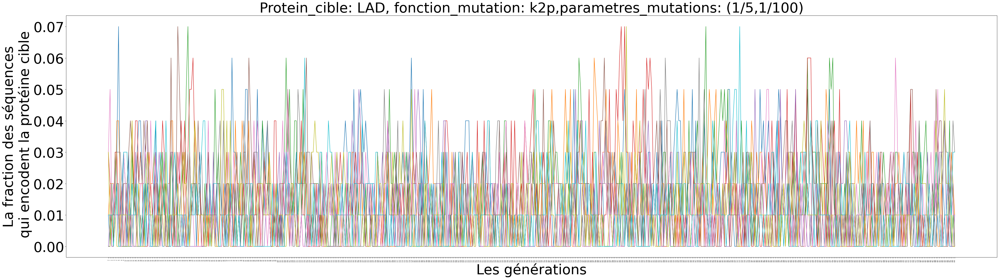

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_k2p_lad_5_100['Generation'])
plt.plot(df_k2p_lad_5_100['individu1'].astype(float))
plt.plot(df_k2p_lad_5_100['individu2'].astype(float))
plt.plot(df_k2p_lad_5_100['individu3'].astype(float))
plt.plot(df_k2p_lad_5_100['individu4'].astype(float))
plt.plot(df_k2p_lad_5_100['individu5'].astype(float))
plt.plot(df_k2p_lad_5_100['individu6'].astype(float))
plt.plot(df_k2p_lad_5_100['individu7'].astype(float))
plt.plot(df_k2p_lad_5_100['individu8'].astype(float))
plt.plot(df_k2p_lad_5_100['individu9'].astype(float))
plt.plot(df_k2p_lad_5_100['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: LAD, fonction_mutation: k2p,parametres_mutations: (1/5,1/100)',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_k2p_lad_5_100')
plt.show()



---


**protein_cible = 'LAD'**

**fonction_mutation = "k2p"**

**parametres_mutations = (1/50, 1/100)**


---



In [ ]:
#Faites le trois fois avec k2p en utilisant comme taux de mutations [1/50,1/100]
protein_cible = 'LAD'
fonction_mutation = 'k2p'
parametres_mutations = [1/50,1/100]
n_total_generation = 500

#répéter 10x cette procédure
fraction_k2p_lad_50_100_1 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_1)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.05, 0.04, 0.04040404040404041, 0.04040404040404041, 0.030612244897959183, 0.041666666666666664, 0.010526315789473684, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01098901098901099, 0.011235955056179775, 0.033707865168539325, 0.033707865168539325, 0.033707865168539325, 0.06741573033707865, 0.03488372093023256, 0.023255813953488372, 0.03488372093023256, 0.023255813953488372, 0.023529411764705882, 0.0, 0.0, 0.0, 0.0, 0.025, 0.0, 0.012987012987012988, 0.0, 0.0, 0.0, 0.0, 0.013513513513513514, 0.013513513513513514, 0.02702702702702703, 0.08108108108108109, 0.08108108108108109, 0.04054054054054054, 0.0821917808219178, 0.0136986301369863, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014285714285714285, 0.014285714285714285, 0.0, 0.0, 0.0, 0.0, 0.015384615384615385, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.04838709677419355, 0.0, 0.0, 0.0, 0.0, 0.0, 0.016129032258064516, 0.0, 0.0, 0.01639344262295082, 0.01639344262295082, 0.03333333333333333, 0.05, 0.06779661016949153, 0.1016949152542373, 0.03389830508474576, 0.03

In [ ]:
fraction_k2p_lad_50_100_2 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_2)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.03, 0.04, 0.04081632653061224, 0.052083333333333336, 0.09473684210526316, 0.07368421052631578, 0.0425531914893617, 0.021505376344086023, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01098901098901099, 0.0, 0.0, 0.0, 0.011363636363636364, 0.0, 0.0, 0.011627906976744186, 0.03529411764705882, 0.023809523809523808, 0.05952380952380952, 0.03614457831325301, 0.060240963855421686, 0.03614457831325301, 0.060240963855421686, 0.060240963855421686, 0.07317073170731707, 0.08536585365853659, 0.08641975308641975, 0.08974358974358974, 0.05194805194805195, 0.11688311688311688, 0.1038961038961039, 0.09210526315789473, 0.05263157894736842, 0.10526315789473684, 0.12, 0.13513513513513514, 0.136986301369863, 0.16666666666666666, 0.06944444444444445, 0.11267605633802817, 0.08571428571428572, 0.1, 0.05714285714285714, 0.028985507246376812, 0.029411764705882353, 0.04477611940298507, 0.03125, 0.031746031746031744, 0.0, 0.0, 0.0, 0.0, 0.01694915254237288, 0.05084745762711865, 0.03389830508474576, 0.017241379310344827, 0.

In [ ]:
fraction_k2p_lad_50_100_3 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_3)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.010752688172043012, 0.0, 0.0, 0.0, 0.0, 0.011235955056179775, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.023809523809523808, 0.036585365853658534, 0.036585365853658534, 0.04878048780487805, 0.036585365853658534, 0.0125, 0.0125, 0.0125, 0.012658227848101266, 0.0379746835443038, 0.012987012987012988, 0.03896103896103896, 0.013157894736842105, 0.0, 0.0, 0.013513513513513514, 0.0273972602739726, 0.0273972602739726, 0.041666666666666664, 0.041666666666666664, 0.06944444444444445, 0.08333333333333333, 0.07042253521126761, 0.056338028169014086, 0.04225352112676056, 0.04225352112676056, 0.04225352112676056, 0.08695652173913043, 0.11594202898550725, 0.11594202898550725, 0.10144927536231885, 0.057971014492753624, 0.07246376811594203, 0.13043478260869565, 0.18840579710144928, 0.07246376811594203, 0.028985507246376812, 0.058823529411764705, 0.08955223880597014, 0.10606060606060606, 0.16923076923076924, 0.203125, 0.140625, 0.08064516129032258, 0.09677419354

In [ ]:
fraction_k2p_lad_50_100_4 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_4)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.02, 0.01, 0.020202020202020204, 0.02040816326530612, 0.030612244897959183, 0.041237113402061855, 0.0, 0.020833333333333332, 0.041666666666666664, 0.031578947368421054, 0.021739130434782608, 0.03260869565217391, 0.02197802197802198, 0.03296703296703297, 0.02197802197802198, 0.011111111111111112, 0.011111111111111112, 0.011111111111111112, 0.011235955056179775, 0.02247191011235955, 0.02247191011235955, 0.022727272727272728, 0.011627906976744186, 0.011627906976744186, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.012345679012345678, 0.024691358024691357, 0.0, 0.012658227848101266, 0.012658227848101266, 0.01282051282051282, 0.038461538461538464, 0.06493506493506493, 0.1038961038961039, 0.09210526315789473, 0.02631578947368421, 0.02666666666666667, 0.013333333333333334, 0.0, 0.0, 0.0, 0.0, 0.014705882352941176, 0.029411764705882353, 0.029411764705882353, 0.058823529411764705, 0.058823529411764705, 0.04411764705882353, 0.014705882352941176, 0.014925373134328358, 0.045454545454545456, 0.0606060606060606

In [ ]:
fraction_k2p_lad_50_100_5 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_5)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.010526315789473684, 0.021052631578947368, 0.021052631578947368, 0.021739130434782608, 0.010869565217391304, 0.010869565217391304, 0.011111111111111112, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.011494252873563218, 0.023255813953488372, 0.058823529411764705, 0.05952380952380952, 0.03571428571428571, 0.03614457831325301, 0.024691358024691357, 0.05, 0.06493506493506493, 0.03896103896103896, 0.03896103896103896, 0.013157894736842105, 0.013157894736842105, 0.039473684210526314, 0.0, 0.0, 0.02666666666666667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014084507042253521, 0.028985507246376812, 0.043478260869565216, 0.043478260869565216, 0.04411764705882353, 0.04411764705882353, 0.058823529411764705, 0.05970149253731343, 0.08955223880597014, 0.07575757575757576, 0.045454545454545456, 0.015151515151515152, 0.015384615384615385, 0.03076923076923077, 0.03076923076923077, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
fraction_k2p_lad_50_100_6 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_6)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.010416666666666666, 0.021052631578947368, 0.021052631578947368, 0.021052631578947368, 0.02127659574468085, 0.021505376344086023, 0.021739130434782608, 0.010869565217391304, 0.021739130434782608, 0.010869565217391304, 0.010869565217391304, 0.0, 0.021739130434782608, 0.03296703296703297, 0.02197802197802198, 0.02247191011235955, 0.011494252873563218, 0.011627906976744186, 0.023255813953488372, 0.05952380952380952, 0.08333333333333333, 0.0963855421686747, 0.10843373493975904, 0.08433734939759036, 0.08433734939759036, 0.04819277108433735, 0.024390243902439025, 0.024691358024691357, 0.037037037037037035, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013157894736842105, 0.02631578947368421, 0.02631578947368421, 0.04, 0.08108108108108109, 0.05714285714285714, 0.04285714285714286, 0.08571428571428572, 0.08695652173913043, 0.057971014492753624, 0.057971014492753624, 0.11594202898550725, 0.11594202898550725, 0.10144927536231885, 0.07352941176470588, 0.119402985074626

In [ ]:
fraction_k2p_lad_50_100_7 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_7)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.02, 0.03, 0.03, 0.02040816326530612, 0.01020408163265306, 0.020618556701030927, 0.05319148936170213, 0.010869565217391304, 0.010869565217391304, 0.021739130434782608, 0.043478260869565216, 0.03260869565217391, 0.03260869565217391, 0.03296703296703297, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.012345679012345678, 0.024691358024691357, 0.012345679012345678, 0.037037037037037035, 0.025, 0.0125, 0.0, 0.01282051282051282, 0.05263157894736842, 0.02702702702702703, 0.013513513513513514, 0.02702702702702703, 0.02702702702702703, 0.013513513513513514, 0.0273972602739726, 0.0136986301369863, 0.0410958904109589, 0.0547945205479452, 0.1527777777777778, 0.1527777777777778, 0.17391304347826086, 0.14492753623188406, 0.08955223880597014, 0.12121212121212122, 0.10606060606060606, 0.09230769230769231, 0.031746031746031744, 0.03225806451612903, 0.06451612903225806, 0.03225806451612903, 0.01639344262295082, 0.03333333333333333, 0.03333333333333333, 0.08333333333333333, 0.0847457627118644, 0.25, 0.

In [ ]:
fraction_k2p_lad_50_100_8 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_8)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.02, 0.02, 0.01, 0.03, 0.02, 0.04040404040404041, 0.010101010101010102, 0.030927835051546393, 0.010309278350515464, 0.010309278350515464, 0.030927835051546393, 0.042105263157894736, 0.031578947368421054, 0.05319148936170213, 0.021505376344086023, 0.03260869565217391, 0.02247191011235955, 0.02247191011235955, 0.02247191011235955, 0.0, 0.0, 0.0, 0.0, 0.011363636363636364, 0.011363636363636364, 0.023255813953488372, 0.023529411764705882, 0.011764705882352941, 0.023529411764705882, 0.047619047619047616, 0.05952380952380952, 0.09523809523809523, 0.14285714285714285, 0.07142857142857142, 0.04819277108433735, 0.03614457831325301, 0.024096385542168676, 0.012345679012345678, 0.0125, 0.0, 0.0, 0.012658227848101266, 0.012658227848101266, 0.02564102564102564, 0.06493506493506493, 0.04, 0.02702702702702703, 0.0, 0.014285714285714285, 0.0, 0.0, 0.0, 0.015384615384615385, 0.03076923076923077, 0.015384615384615385, 0.03076923076923077, 0.015384615384615385, 0.0, 0.0, 0.0, 0.016129032258064

In [ ]:
fraction_k2p_lad_50_100_9 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_9)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.010101010101010102, 0.010101010101010102, 0.010101010101010102, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.010869565217391304, 0.05434782608695652, 0.021739130434782608, 0.021739130434782608, 0.02197802197802198, 0.0, 0.0, 0.0, 0.0, 0.0, 0.022727272727272728, 0.0, 0.023255813953488372, 0.0, 0.0, 0.0, 0.0, 0.011764705882352941, 0.011904761904761904, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.012987012987012988, 0.013513513513513514, 0.0136986301369863, 0.0136986301369863, 0.0136986301369863, 0.0, 0.014285714285714285, 0.014492753623188406, 0.029411764705882353, 0.07352941176470588, 0.1323529411764706, 0.17647058823529413, 0.2647058823529412, 0.14925373134328357, 0.13432835820895522, 0.15384615384615385, 0.14285714285714285, 0.20634920634920634, 0.15873015873015872, 0.1111111111111111, 0.1111111111111111, 0.06349206349206349, 0.14285714285714285, 0.09836065573770492, 0.05, 0.15254237288135594, 0.1864406779661017, 0.2711864406779661, 0.3220338983050847, 0.22

In [ ]:
fraction_k2p_lad_50_100_10 = fractionCiblePerGeneration(protein_cible,fonction_mutation,parametres_mutations,n_total_generation)
print(fraction_k2p_lad_50_100_10)

/usr/local/lib/python3.7/dist-packages/Bio/Seq.py:2338: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.012195121951219513, 0.037037037037037035, 0.06172839506172839, 0.075, 0.10256410256410256, 0.07792207792207792, 0.05194805194805195, 0.09090909090909091, 0.04, 0.06666666666666667, 0.08108108108108109, 0.1111111111111111, 0.09722222222222222, 0.028169014084507043, 0.02857142857142857, 0.02857142857142857, 0.014285714285714285, 0.014285714285714285, 0.014285714285714285, 0.014285714285714285, 0.028985507246376812, 0.028985507246376812, 0.014705882352941176, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.017241379310344827, 0.0, 0.0, 0.017241379310344827, 0.0, 0.0, 0.0, 0.0, 0.0, 0.017543859649122806, 0.0, 0.0, 0.0, 0.0, 0.01818181818181818, 0.03636363636363636, 0.018518518518518517, 0.018518518518518517, 0.05660377358490566, 0.05660377358490566, 0.07547169811320754, 0.03773584905660377, 0.038461538461538464, 0.0196078431372549, 0.0196078431372549, 0.01960784313

In [ ]:
df_k2p_lad_50_100 = pd.DataFrame({"individu1":fraction_k2p_lad_50_100_1,
                          "individu2":fraction_k2p_lad_50_100_2,
                          "individu3":fraction_k2p_lad_50_100_3,
                          "individu4":fraction_k2p_lad_50_100_4,
                          "individu5":fraction_k2p_lad_50_100_5,
                          "individu6":fraction_k2p_lad_50_100_6,
                          "individu7":fraction_k2p_lad_50_100_7,
                          "individu8":fraction_k2p_lad_50_100_8,
                          "individu9":fraction_k2p_lad_50_100_9,
                          "individu10":fraction_k2p_lad_50_100_10,
                          "Generation": range(501)})
df_k2p_lad_50_100.head()

,individu1,individu2,individu3,individu4,individu5,individu6,individu7,individu8,individu9,individu10,Generation
0,0.050000,0.030000,0.0,0.020000,0.01,0.000000,0.020000,0.00,0.000000,0.0,0
1,0.040000,0.040000,0.0,0.010000,0.00,0.000000,0.030000,0.00,0.000000,0.0,1
2,0.040404,0.040816,0.0,0.020202,0.00,0.000000,0.030000,0.02,0.000000,0.0,2
3,0.040404,0.052083,0.0,0.020408,0.00,0.000000,0.020408,0.02,0.000000,0.0,3
4,0.030612,0.094737,0.0,0.030612,0.00,0.010417,0.010204,0.01,0.010101,0.0,4


<Figure size 432x288 with 0 Axes>

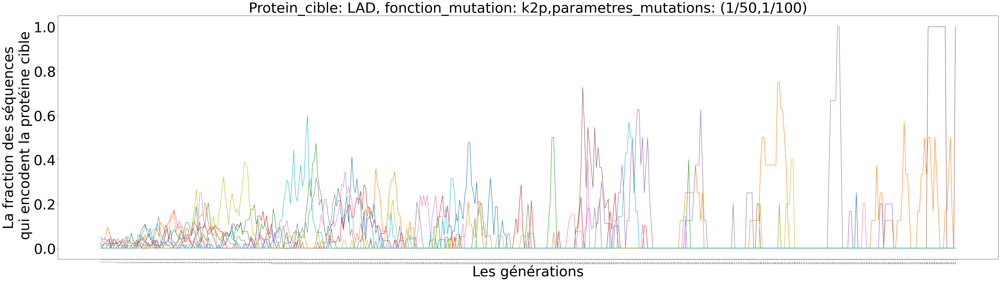

In [ ]:
# Faire la figure
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.figure()

figure(num=None, figsize=(60, 16), dpi=80, facecolor='w', edgecolor='k')

plt.xticks(range(501), df_k2p_lad_50_100['Generation'])
plt.plot(df_k2p_lad_50_100['individu1'].astype(float))
plt.plot(df_k2p_lad_50_100['individu2'].astype(float))
plt.plot(df_k2p_lad_50_100['individu3'].astype(float))
plt.plot(df_k2p_lad_50_100['individu4'].astype(float))
plt.plot(df_k2p_lad_50_100['individu5'].astype(float))
plt.plot(df_k2p_lad_50_100['individu6'].astype(float))
plt.plot(df_k2p_lad_50_100['individu7'].astype(float))
plt.plot(df_k2p_lad_50_100['individu8'].astype(float))
plt.plot(df_k2p_lad_50_100['individu9'].astype(float))
plt.plot(df_k2p_lad_50_100['individu10'].astype(float))

plt.xlabel("Les générations",fontsize = 50)
plt.ylabel("La fraction des séquences\n qui encodent la protéine cible",fontsize=50)
plt.title('Protein_cible: LAD, fonction_mutation: k2p,parametres_mutations: (1/50,1/100)',fontsize=50)
plt.yticks(fontsize=50)
plt.xticks(fontsize=5)

for item in plt.gca().xaxis.get_ticklabels():
  item.set_rotation(90)
plt.savefig('df_k2p_lad_50_100')
plt.show()